In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import pickle
import time

import mona
import mona_utils

from importlib import reload
from PIL import Image, ImageDraw
#reload(mona)
#reload(mona_utils)

## Introduction

This is a report on a project for Evolutionary Algorithms course at University of Wroclaw. The task was to reconstruct given image by shapes found by the evolutionary algorithm. Constructed image should be similar to original image in a pixel difference sense.

### Related work

<a href="https://www.youtube.com/watch?v=rGt3iMAJVT8">Mona lisa with circles 1</a><br>
<a href="https://www.youtube.com/watch?v=f5g8k-n4j_o">Mona lisa with circles 2</a><br>
<a href="https://www.youtube.com/watch?v=Yz9MuI-tkiw">Mona lisa with polygons</a><br>


## Evolutionary Algorithm

### Procedure

The algorithm evolves shapes in serial order. It starts from an black empty image and does a 'greedy evolutionary search' for successive shapes which will construct final image. It evolves only one shape at the time. If there is no improvement for a long time, it adds the shape to a image, reinitializes the population of shapes and starts search of next most suited shape. It repeats these steps until it draws maximum number of shapes (parameter of the algorithm).

Evolving shapes in serial order allows to save computing time. We don't have to redraw all shapes for each invdividual. Instead we copy fixed image and draw a shape from population. 

Image similarity is computed with simple absolute difference between pixels of two images.

#### Pseudocode
<ol>
<li>Begin with an empty fixed image</li>
<li>Generate population of random shapes</li>
<li>For each shape: draw an image with this shape, use fixed image as background</li>
<li>Compute fitness for each image (shape)</li>
<br>
Repeat until fixed image has less than <i>max_shapes</i> shapes:
<li>Use roullete method to choose shapes for reproduction</li>
<li>Cross chosen shapes and mutate them with standard evolutionary strategy mutation</li>
<li>Compute fitness for images created with new shapes and the fixed image as background</li>
<li>Choose the best shapes from sum of parents and children populations, use them as new population</li>
<li>If there is no improvement (no best solution change) for a long time but there was some improvement earlier for current shape:
    <ul>
    <li>Add current shape to fixed image</li>
    <li>Go to step 2</li>
    </ul>
</li>
</ol>

#### Example

To explain the algorithm, I'll write a short example of actual algorithm procedure:

Algorithm starts with empty fixed image and population of 50 circles. Each circle is encoded as vector of 7 floating numbers, so our population is a matix of a size 50x7. To calculate loss for each circle, the algorithm creates 50 copies of fixed image and draw single shape from population on each copy of fixed image. Then it computes pixel difference between created images and target image. It uses best images for reproduction. After reproduction, it checks if there is any better image in the population than the best solution. It repeats these steps for some time. If there was no update to best solution for a long time, it chooses the best solution (best shape) and draw it on fixed image. Now it can reinitialize population and repeat the procedure, but now it uses the fixed image with new shape as background.

### Details

#### Adding shapes

<p>It is possible for the algorithm that, at some step, it won't find any shape that will make improvement to current best fixed image. For example, if we have image with 200 shapes and algorithm is searching for 201th shape, it is possible that (even after a lot of iterations) each shape in 201th shape population will make the fitness of fixed image worse. In such case, instead of adding this defective shape to fixed image, th algorithm reinitializes the population and tries to repeat the procedure.</p>

#### Encoding

<p>In the algorithm, each shape is encoded as vector of length <i>k</i> of floating numbers in range <i>[0,10]</i>. For circle <i>k = 7</i>, and it's projected to vector <i>(x, y, radius, r, g, b, alpha)</i>, where <i>x,y</i> are coordinates of the circle's centre and <i>(r, g, b, alpha)</i> is color of the circle.</p>

#### Performance

I tested three python drawing libraries: Scikit-image, Pillow and OpenCV. The OpenCV turned out to be the fastest.

To get better performance I used multiprocessing library to draw shapes in seprate concurrent processes for each image. 

I've also added CUDA option in image evaluator. It is simple PyTorch tensor with CUDA option. It gives significant performance boost when comparing population of all images to target image and calculating the loss.



## Training data 

Loading training data and resizing it to proper resolution. 

For images with bigger resolution the algorithm requires more computing time and bigger number of shapes to give good results.

Here you should also set algorithm settings - width, height of the image and length of shape encoding vector

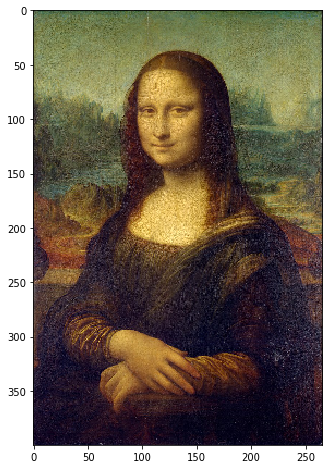

In [10]:
target_img = Image.open("mona.jpg").resize((266,400))
#target_img = Image.open("mona_small.png").convert("RGB")
#target_img = Image.open("mona_face.png").convert("RGB").resize((200,250))

target_img = np.asarray(target_img)
plt.figure(figsize=(10, 8))
plt.imshow(target_img)
plt.show()

HEIGHT = target_img.shape[0]
WIDTH = target_img.shape[1]
SHAPE_LEN = 7 # length of encoded shape vector

## Optimization

The algorithm optimizes difference between reconstructed image and target image. The difference is computed as Euclidean norm between pixels. Candidate solutions are coordinates and colors of shapes.



## Experiment 1

Experiment with low resolution image (250 px x 200 px).

In this experiment max number of shapes is set to 400. 
Population size is 70, child population size is 140.
New shape is added after 50 passive iterations.

Shape count = 1, Iteration 0000, Time = 0.1 sec. 
Best score = 29477.0, Mean score = 33395.3. Std = 1197.96.


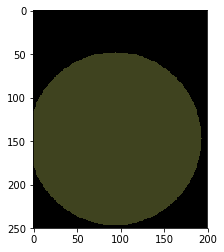

Shape count = 4, Iteration 0500, Time = 26.3 sec. 
Best score = 14686.9, Mean score = 14687.6. Std = 0.40.


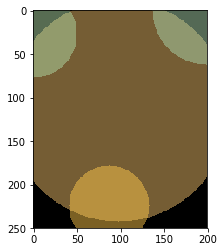

Shape count = 8, Iteration 1000, Time = 52.4 sec. 
Best score = 11519.7, Mean score = 11613.5. Std = 39.36.


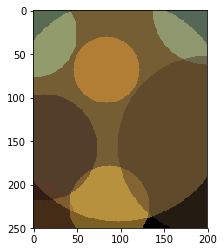

Shape count = 11, Iteration 1500, Time = 78.7 sec. 
Best score = 10495.2, Mean score = 10495.3. Std = 0.02.


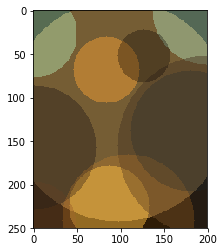

Shape count = 14, Iteration 2000, Time = 104.6 sec. 
Best score = 9838.5, Mean score = 9839.2. Std = 0.29.


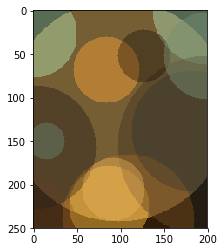

Shape count = 18, Iteration 2500, Time = 130.0 sec. 
Best score = 9046.7, Mean score = 9058.7. Std = 6.11.


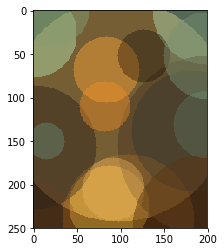

Shape count = 22, Iteration 3000, Time = 156.4 sec. 
Best score = 8543.5, Mean score = 8544.2. Std = 0.31.


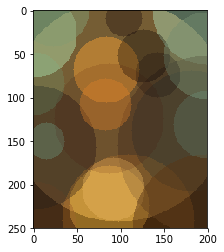

Shape count = 25, Iteration 3500, Time = 182.4 sec. 
Best score = 7988.1, Mean score = 7988.1. Std = 0.00.


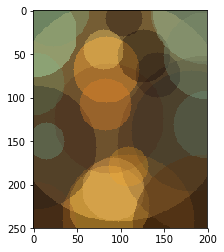

Shape count = 28, Iteration 4000, Time = 208.7 sec. 
Best score = 7696.5, Mean score = 7696.7. Std = 0.06.


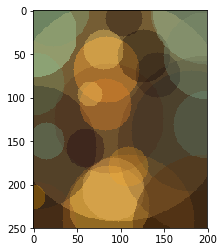

Shape count = 31, Iteration 4500, Time = 234.7 sec. 
Best score = 7429.0, Mean score = 7429.0. Std = 0.00.


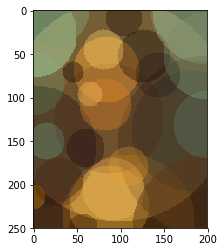

Shape count = 34, Iteration 5000, Time = 260.9 sec. 
Best score = 7248.1, Mean score = 7248.1. Std = 0.00.


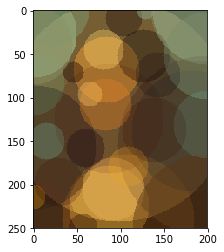

Shape count = 36, Iteration 5500, Time = 287.1 sec. 
Best score = 7170.7, Mean score = 7170.7. Std = 0.00.


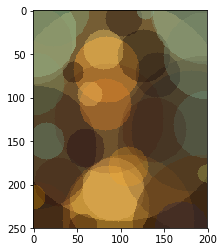

Shape count = 40, Iteration 6000, Time = 313.4 sec. 
Best score = 6965.2, Mean score = 6969.0. Std = 1.05.


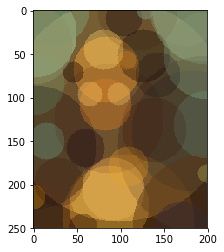

Shape count = 43, Iteration 6500, Time = 339.5 sec. 
Best score = 6842.6, Mean score = 6847.4. Std = 1.36.


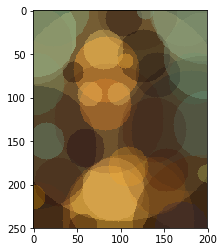

Shape count = 46, Iteration 7000, Time = 365.8 sec. 
Best score = 6708.0, Mean score = 6715.4. Std = 2.14.


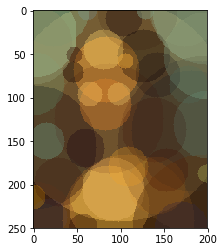

Shape count = 48, Iteration 7500, Time = 392.1 sec. 
Best score = 6631.1, Mean score = 6632.3. Std = 0.42.


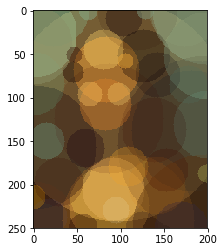

Shape count = 50, Iteration 8000, Time = 418.3 sec. 
Best score = 6534.6, Mean score = 6534.6. Std = 0.00.


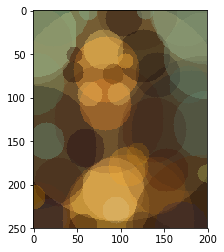

Shape count = 53, Iteration 8500, Time = 444.6 sec. 
Best score = 6388.9, Mean score = 6389.0. Std = 0.05.


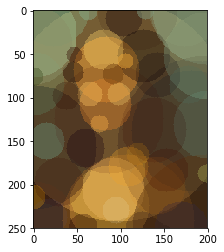

Shape count = 56, Iteration 9000, Time = 470.8 sec. 
Best score = 6269.3, Mean score = 6270.6. Std = 0.67.


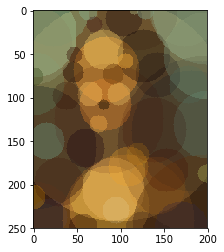

Shape count = 60, Iteration 9500, Time = 497.2 sec. 
Best score = 6148.5, Mean score = 6164.5. Std = 3.49.


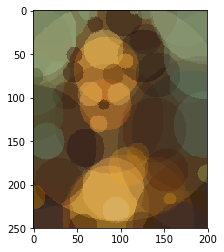

Shape count = 63, Iteration 10000, Time = 523.5 sec. 
Best score = 6044.1, Mean score = 6044.6. Std = 0.18.


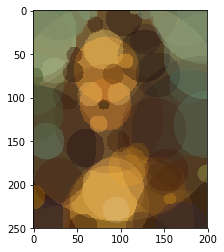

Shape count = 66, Iteration 10500, Time = 549.8 sec. 
Best score = 5955.3, Mean score = 5955.4. Std = 0.05.


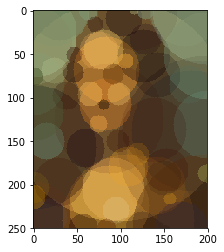

Shape count = 70, Iteration 11000, Time = 576.4 sec. 
Best score = 5869.5, Mean score = 5869.5. Std = 0.00.


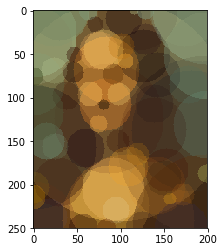

Shape count = 74, Iteration 11500, Time = 602.5 sec. 
Best score = 5775.1, Mean score = 5780.0. Std = 1.42.


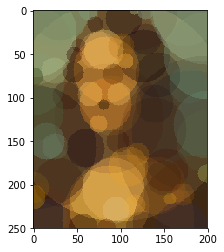

Shape count = 77, Iteration 12000, Time = 628.5 sec. 
Best score = 5704.0, Mean score = 5705.6. Std = 0.59.


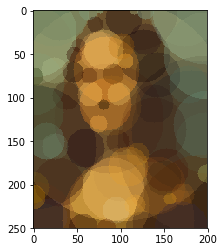

Shape count = 80, Iteration 12500, Time = 654.6 sec. 
Best score = 5669.4, Mean score = 5679.5. Std = 1.77.


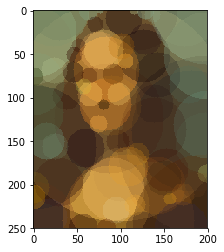

Shape count = 83, Iteration 13000, Time = 681.0 sec. 
Best score = 5600.1, Mean score = 5601.6. Std = 0.53.


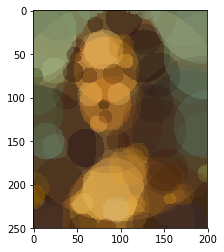

Shape count = 85, Iteration 13500, Time = 707.2 sec. 
Best score = 5575.3, Mean score = 5575.6. Std = 0.12.


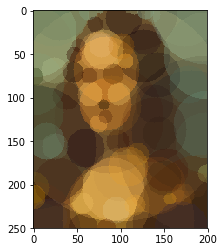

Shape count = 89, Iteration 14000, Time = 733.6 sec. 
Best score = 5518.8, Mean score = 5519.5. Std = 0.15.


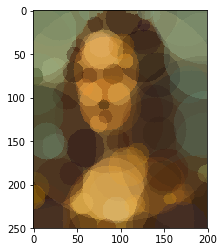

Shape count = 91, Iteration 14500, Time = 759.8 sec. 
Best score = 5482.2, Mean score = 5482.6. Std = 0.19.


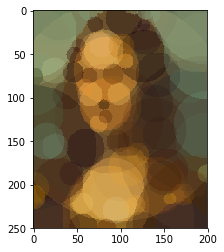

Shape count = 95, Iteration 15000, Time = 785.9 sec. 
Best score = 5428.5, Mean score = 5430.1. Std = 0.38.


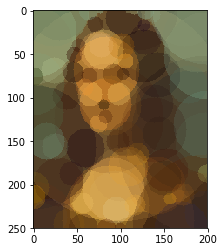

Shape count = 98, Iteration 15500, Time = 812.3 sec. 
Best score = 5384.8, Mean score = 5389.6. Std = 1.72.


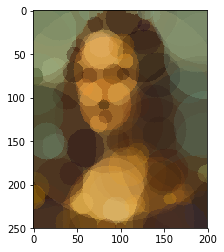

Shape count = 101, Iteration 16000, Time = 838.7 sec. 
Best score = 5349.3, Mean score = 5359.7. Std = 2.17.


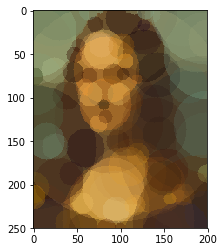

Shape count = 103, Iteration 16500, Time = 864.7 sec. 
Best score = 5306.3, Mean score = 5306.3. Std = 0.00.


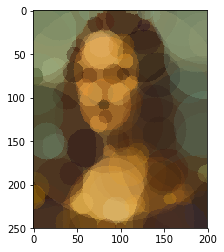

Shape count = 108, Iteration 17000, Time = 891.1 sec. 
Best score = 5248.7, Mean score = 5250.7. Std = 0.86.


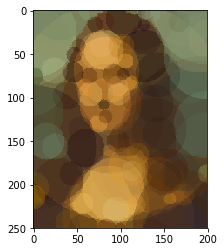

Shape count = 112, Iteration 17500, Time = 917.3 sec. 
Best score = 5210.5, Mean score = 5210.9. Std = 0.06.


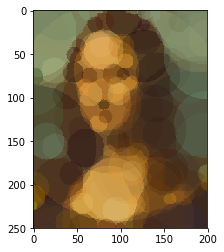

Shape count = 116, Iteration 18000, Time = 943.5 sec. 
Best score = 5150.5, Mean score = 5151.7. Std = 0.36.


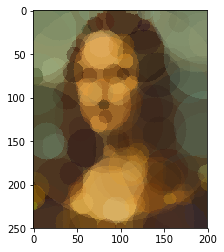

Shape count = 119, Iteration 18500, Time = 969.7 sec. 
Best score = 5096.8, Mean score = 5096.8. Std = 0.00.


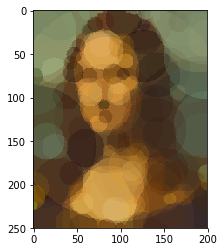

Shape count = 123, Iteration 19000, Time = 995.6 sec. 
Best score = 5047.2, Mean score = 5053.4. Std = 2.64.


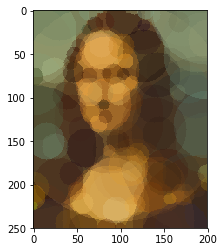

Shape count = 126, Iteration 19500, Time = 1021.1 sec. 
Best score = 5007.1, Mean score = 5007.4. Std = 0.13.


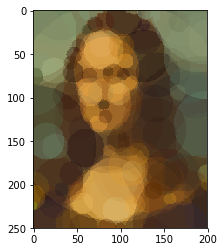

Shape count = 128, Iteration 20000, Time = 1047.5 sec. 
Best score = 4977.1, Mean score = 4977.2. Std = 0.03.


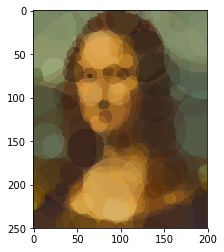

Shape count = 131, Iteration 20500, Time = 1073.8 sec. 
Best score = 4955.5, Mean score = 4955.8. Std = 0.07.


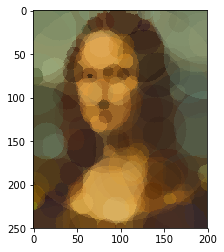

Shape count = 135, Iteration 21000, Time = 1100.0 sec. 
Best score = 4914.5, Mean score = 4915.7. Std = 0.32.


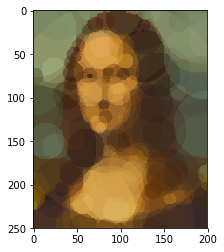

Shape count = 137, Iteration 21500, Time = 1126.3 sec. 
Best score = 4887.4, Mean score = 4888.4. Std = 0.32.


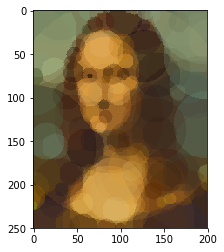

Shape count = 139, Iteration 22000, Time = 1152.6 sec. 
Best score = 4862.7, Mean score = 4867.7. Std = 1.70.


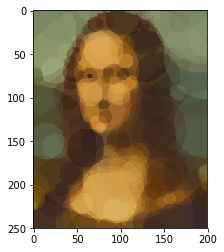

Shape count = 143, Iteration 22500, Time = 1179.0 sec. 
Best score = 4835.6, Mean score = 4839.7. Std = 1.26.


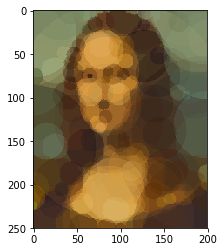

Shape count = 145, Iteration 23000, Time = 1205.2 sec. 
Best score = 4817.2, Mean score = 4817.2. Std = 0.01.


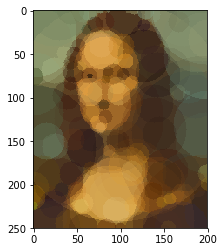

Shape count = 148, Iteration 23500, Time = 1231.3 sec. 
Best score = 4793.8, Mean score = 4794.7. Std = 0.25.


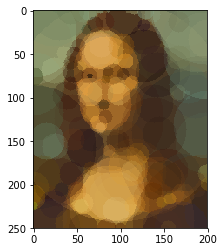

Shape count = 151, Iteration 24000, Time = 1257.4 sec. 
Best score = 4770.3, Mean score = 4770.3. Std = 0.00.


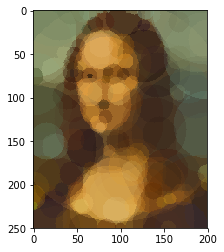

Shape count = 154, Iteration 24500, Time = 1283.4 sec. 
Best score = 4747.7, Mean score = 4747.7. Std = 0.01.


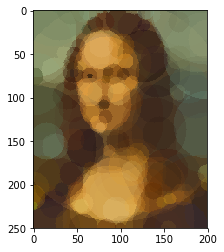

Shape count = 158, Iteration 25000, Time = 1309.8 sec. 
Best score = 4729.9, Mean score = 4731.1. Std = 0.42.


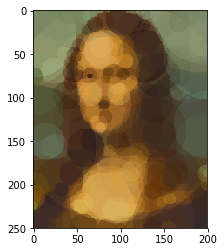

Shape count = 161, Iteration 25500, Time = 1336.0 sec. 
Best score = 4699.8, Mean score = 4700.1. Std = 0.08.


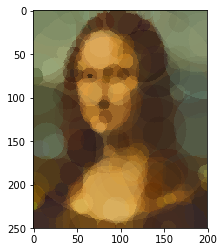

Shape count = 164, Iteration 26000, Time = 1362.3 sec. 
Best score = 4679.8, Mean score = 4680.2. Std = 0.13.


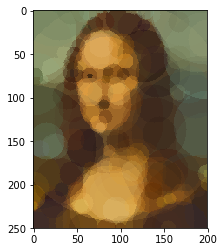

Shape count = 167, Iteration 26500, Time = 1388.6 sec. 
Best score = 4661.2, Mean score = 4661.7. Std = 0.16.


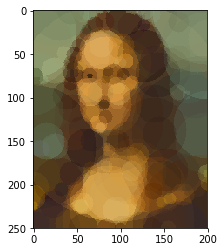

Shape count = 170, Iteration 27000, Time = 1414.8 sec. 
Best score = 4651.6, Mean score = 7442.6. Std = 2777.87.


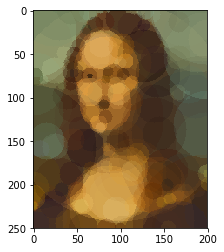

Shape count = 174, Iteration 27500, Time = 1440.8 sec. 
Best score = 4628.5, Mean score = 4629.5. Std = 0.25.


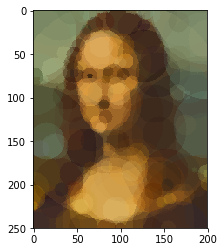

Shape count = 177, Iteration 28000, Time = 1467.0 sec. 
Best score = 4614.0, Mean score = 4614.0. Std = 0.00.


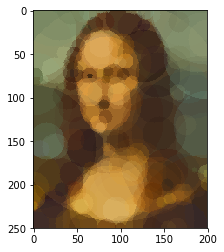

Shape count = 181, Iteration 28500, Time = 1493.2 sec. 
Best score = 4594.2, Mean score = 4595.7. Std = 0.40.


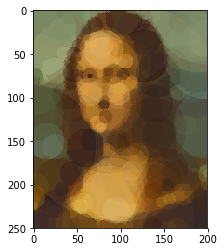

Shape count = 184, Iteration 29000, Time = 1519.4 sec. 
Best score = 4575.2, Mean score = 4576.0. Std = 0.24.


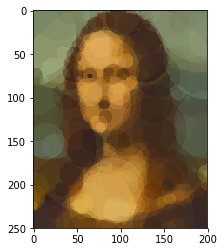

Shape count = 188, Iteration 29500, Time = 1545.6 sec. 
Best score = 4555.0, Mean score = 4555.4. Std = 0.10.


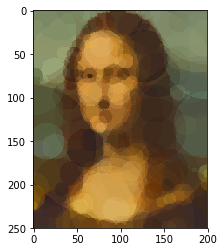

Shape count = 191, Iteration 30000, Time = 1571.8 sec. 
Best score = 4536.9, Mean score = 4537.0. Std = 0.02.


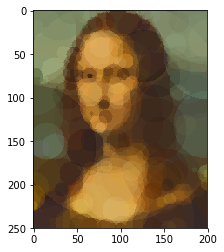

Shape count = 196, Iteration 30500, Time = 1598.1 sec. 
Best score = 4519.0, Mean score = 4524.8. Std = 5.55.


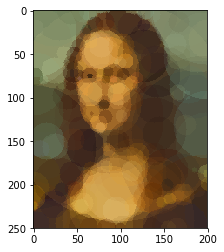

Shape count = 199, Iteration 31000, Time = 1624.3 sec. 
Best score = 4503.4, Mean score = 4505.5. Std = 0.52.


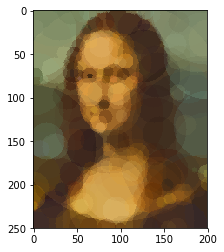

Shape count = 202, Iteration 31500, Time = 1650.5 sec. 
Best score = 4486.4, Mean score = 4488.1. Std = 0.59.


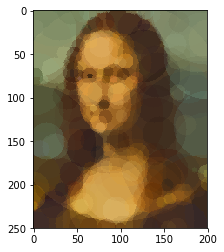

Shape count = 206, Iteration 32000, Time = 1677.0 sec. 
Best score = 4474.7, Mean score = 4476.1. Std = 0.50.


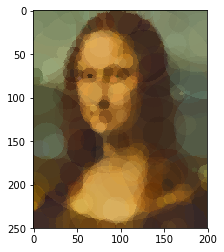

Shape count = 210, Iteration 32500, Time = 1703.5 sec. 
Best score = 4461.7, Mean score = 4463.1. Std = 0.37.


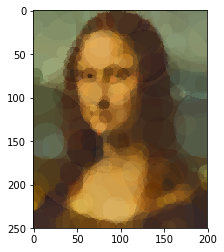

Shape count = 212, Iteration 33000, Time = 1729.9 sec. 
Best score = 4451.6, Mean score = 4452.2. Std = 0.25.


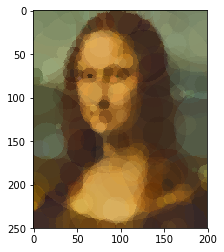

Shape count = 215, Iteration 33500, Time = 1756.3 sec. 
Best score = 4442.4, Mean score = 4443.0. Std = 0.27.


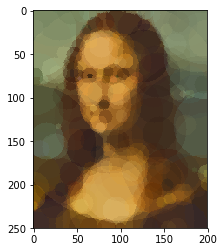

Shape count = 217, Iteration 34000, Time = 1782.6 sec. 
Best score = 4428.4, Mean score = 4428.4. Std = 0.02.


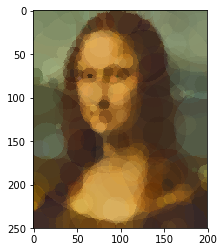

Shape count = 220, Iteration 34500, Time = 1809.0 sec. 
Best score = 4408.3, Mean score = 4408.4. Std = 0.01.


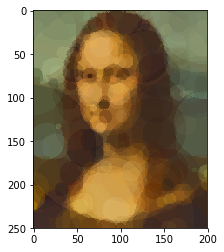

Shape count = 223, Iteration 35000, Time = 1835.5 sec. 
Best score = 4397.7, Mean score = 4397.7. Std = 0.02.


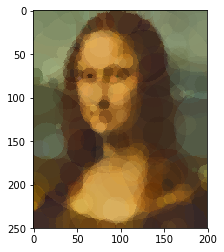

Shape count = 227, Iteration 35500, Time = 1861.9 sec. 
Best score = 4384.8, Mean score = 4385.6. Std = 0.26.


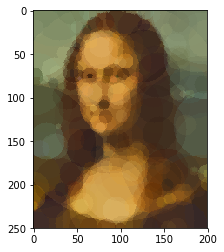

Shape count = 231, Iteration 36000, Time = 1888.2 sec. 
Best score = 4372.8, Mean score = 4373.4. Std = 0.14.


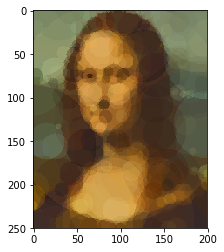

Shape count = 235, Iteration 36500, Time = 1914.7 sec. 
Best score = 4359.2, Mean score = 4359.8. Std = 0.21.


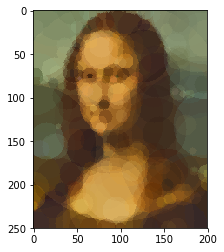

Shape count = 238, Iteration 37000, Time = 1940.9 sec. 
Best score = 4346.7, Mean score = 4348.3. Std = 0.43.


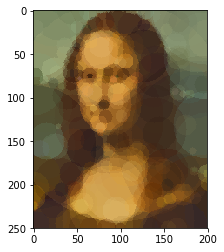

Shape count = 241, Iteration 37500, Time = 1967.2 sec. 
Best score = 4335.5, Mean score = 4336.4. Std = 0.29.


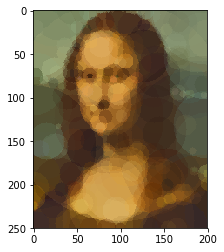

Shape count = 243, Iteration 38000, Time = 1993.4 sec. 
Best score = 4325.7, Mean score = 4326.7. Std = 0.17.


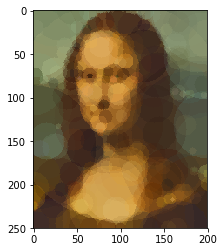

Shape count = 246, Iteration 38500, Time = 2019.6 sec. 
Best score = 4313.4, Mean score = 4313.4. Std = 0.00.


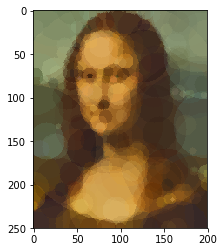

Shape count = 250, Iteration 39000, Time = 2045.9 sec. 
Best score = 4299.4, Mean score = 4299.4. Std = 0.00.


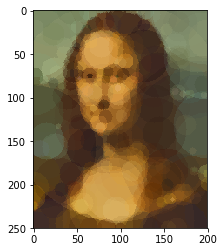

Shape count = 253, Iteration 39500, Time = 2072.2 sec. 
Best score = 4284.7, Mean score = 4284.7. Std = 0.00.


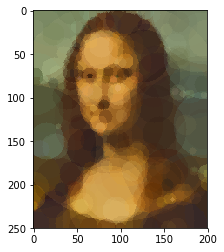

Shape count = 257, Iteration 40000, Time = 2098.3 sec. 
Best score = 4271.7, Mean score = 4271.9. Std = 0.05.


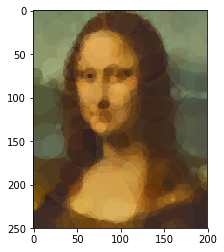

Shape count = 259, Iteration 40500, Time = 2123.6 sec. 
Best score = 4263.4, Mean score = 4263.4. Std = 0.01.


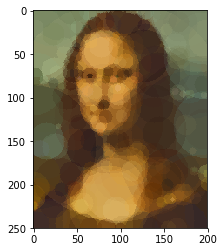

Shape count = 262, Iteration 41000, Time = 2149.9 sec. 
Best score = 4253.2, Mean score = 4253.2. Std = 0.00.


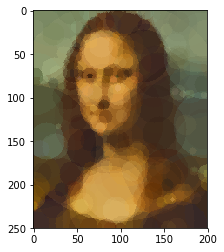

Shape count = 265, Iteration 41500, Time = 2175.8 sec. 
Best score = 4240.6, Mean score = 4240.6. Std = 0.00.


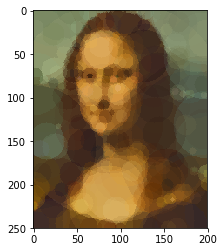

Shape count = 268, Iteration 42000, Time = 2202.1 sec. 
Best score = 4231.5, Mean score = 4231.7. Std = 0.05.


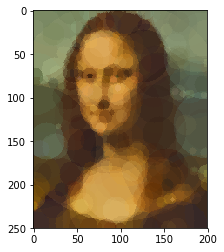

Shape count = 271, Iteration 42500, Time = 2228.4 sec. 
Best score = 4222.4, Mean score = 4222.6. Std = 0.07.


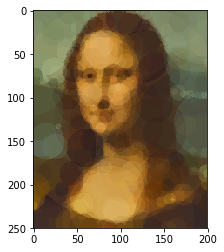

Shape count = 274, Iteration 43000, Time = 2254.6 sec. 
Best score = 4212.5, Mean score = 4212.6. Std = 0.02.


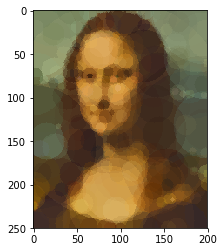

Shape count = 276, Iteration 43500, Time = 2280.8 sec. 
Best score = 4204.5, Mean score = 4204.5. Std = 0.00.


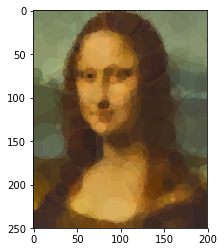

Shape count = 279, Iteration 44000, Time = 2307.2 sec. 
Best score = 4194.5, Mean score = 4194.5. Std = 0.00.


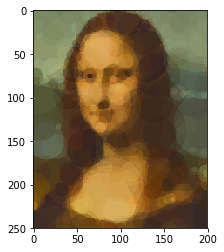

Shape count = 282, Iteration 44500, Time = 2333.7 sec. 
Best score = 4184.7, Mean score = 4184.7. Std = 0.00.


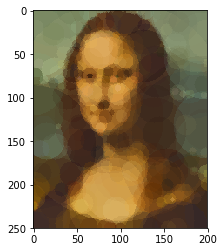

Shape count = 286, Iteration 45000, Time = 2360.0 sec. 
Best score = 4172.1, Mean score = 4172.5. Std = 0.15.


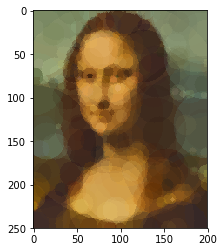

Shape count = 290, Iteration 45500, Time = 2386.4 sec. 
Best score = 4161.8, Mean score = 4162.1. Std = 0.06.


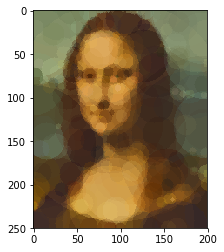

Shape count = 294, Iteration 46000, Time = 2412.8 sec. 
Best score = 4148.0, Mean score = 4148.6. Std = 0.16.


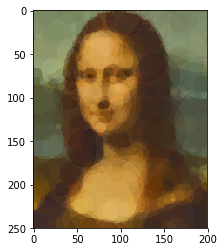

Shape count = 297, Iteration 46500, Time = 2439.1 sec. 
Best score = 4141.6, Mean score = 4141.9. Std = 0.14.


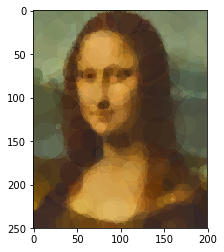

Shape count = 301, Iteration 47000, Time = 2465.6 sec. 
Best score = 4130.8, Mean score = 4131.6. Std = 0.13.


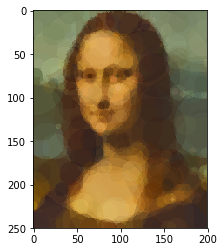

Shape count = 303, Iteration 47500, Time = 2491.8 sec. 
Best score = 4125.6, Mean score = 4125.7. Std = 0.02.


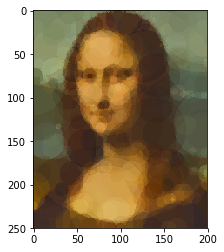

Shape count = 307, Iteration 48000, Time = 2517.9 sec. 
Best score = 4115.3, Mean score = 4115.7. Std = 0.17.


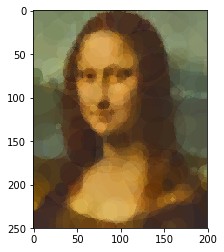

Shape count = 310, Iteration 48500, Time = 2544.0 sec. 
Best score = 4108.7, Mean score = 4108.7. Std = 0.00.


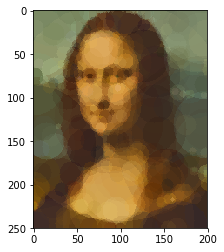

Shape count = 314, Iteration 49000, Time = 2570.1 sec. 
Best score = 4099.1, Mean score = 4099.1. Std = 0.00.


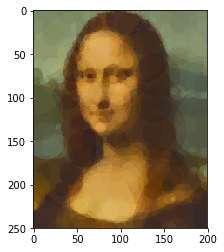

Shape count = 318, Iteration 49500, Time = 2596.4 sec. 
Best score = 4088.5, Mean score = 4090.0. Std = 0.37.


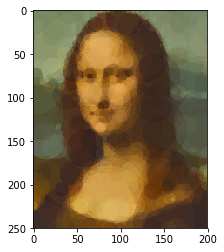

Shape count = 321, Iteration 50000, Time = 2622.6 sec. 
Best score = 4079.1, Mean score = 4079.8. Std = 0.18.


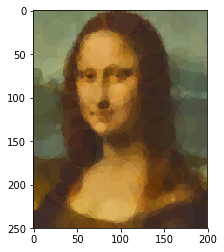

Shape count = 323, Iteration 50500, Time = 2648.8 sec. 
Best score = 4072.3, Mean score = 4072.3. Std = 0.00.


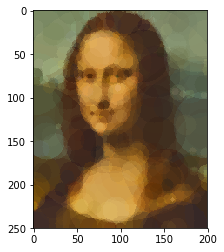

Shape count = 326, Iteration 51000, Time = 2674.9 sec. 
Best score = 4066.0, Mean score = 4066.7. Std = 0.21.


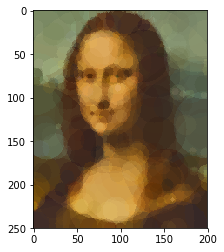

Shape count = 329, Iteration 51500, Time = 2700.7 sec. 
Best score = 4059.9, Mean score = 4060.4. Std = 0.15.


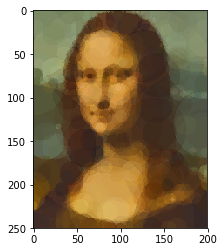

Shape count = 332, Iteration 52000, Time = 2726.9 sec. 
Best score = 4052.0, Mean score = 4052.2. Std = 0.14.


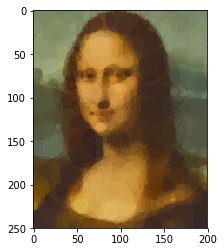

Shape count = 335, Iteration 52500, Time = 2753.2 sec. 
Best score = 4042.0, Mean score = 4042.0. Std = 0.00.


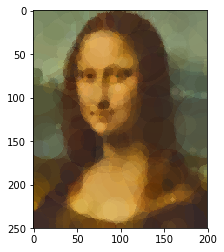

Shape count = 338, Iteration 53000, Time = 2778.8 sec. 
Best score = 4035.3, Mean score = 4036.2. Std = 0.31.


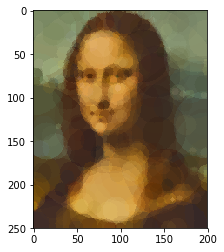

Shape count = 342, Iteration 53500, Time = 2805.4 sec. 
Best score = 4026.5, Mean score = 4027.3. Std = 0.28.


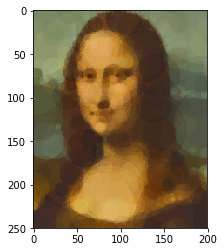

Shape count = 345, Iteration 54000, Time = 2831.8 sec. 
Best score = 4020.0, Mean score = 4020.3. Std = 0.07.


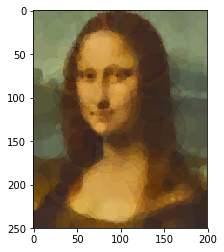

Shape count = 347, Iteration 54500, Time = 2858.2 sec. 
Best score = 4012.9, Mean score = 4013.0. Std = 0.03.


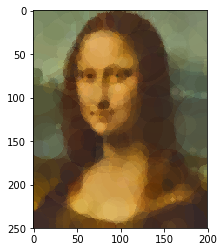

Shape count = 350, Iteration 55000, Time = 2884.5 sec. 
Best score = 4006.6, Mean score = 4006.6. Std = 0.00.


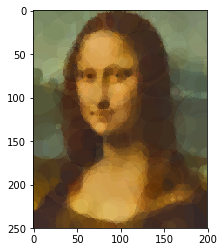

Shape count = 354, Iteration 55500, Time = 2910.9 sec. 
Best score = 3995.8, Mean score = 3996.6. Std = 0.22.


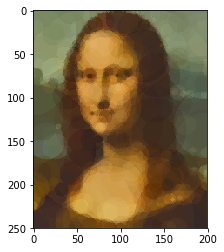

Shape count = 357, Iteration 56000, Time = 2937.2 sec. 
Best score = 3990.7, Mean score = 3991.1. Std = 0.12.


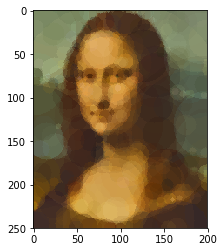

Shape count = 360, Iteration 56500, Time = 2963.3 sec. 
Best score = 3982.7, Mean score = 3982.7. Std = 0.00.


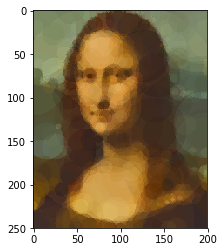

Shape count = 364, Iteration 57000, Time = 2989.2 sec. 
Best score = 3973.4, Mean score = 3974.1. Std = 0.20.


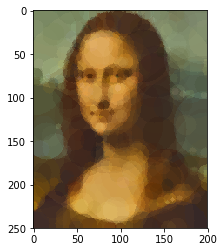

Shape count = 366, Iteration 57500, Time = 3014.0 sec. 
Best score = 3969.3, Mean score = 3969.7. Std = 0.14.


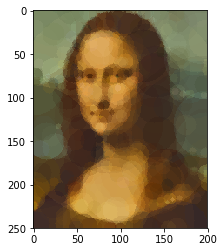

Shape count = 369, Iteration 58000, Time = 3039.9 sec. 
Best score = 3962.3, Mean score = 3963.0. Std = 0.14.


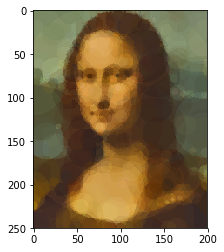

Shape count = 372, Iteration 58500, Time = 3066.2 sec. 
Best score = 3953.9, Mean score = 3953.9. Std = 0.03.


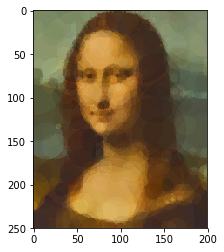

Shape count = 376, Iteration 59000, Time = 3092.6 sec. 
Best score = 3946.5, Mean score = 3946.5. Std = 0.00.


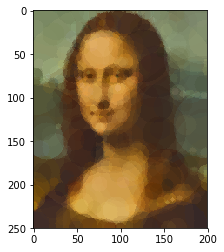

Shape count = 379, Iteration 59500, Time = 3118.8 sec. 
Best score = 3940.4, Mean score = 3941.4. Std = 0.36.


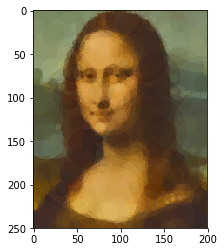

Shape count = 382, Iteration 60000, Time = 3144.8 sec. 
Best score = 3933.7, Mean score = 3934.5. Std = 0.24.


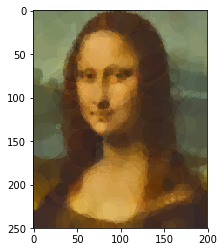

Shape count = 384, Iteration 60500, Time = 3171.2 sec. 
Best score = 3930.5, Mean score = 3930.9. Std = 0.13.


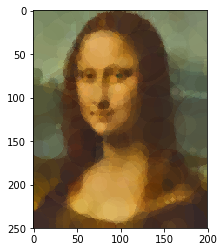

Shape count = 387, Iteration 61000, Time = 3197.5 sec. 
Best score = 3925.5, Mean score = 3925.5. Std = 0.00.


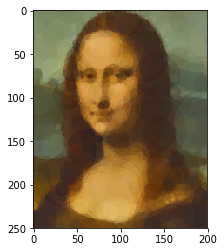

Shape count = 390, Iteration 61500, Time = 3223.8 sec. 
Best score = 3920.7, Mean score = 3920.9. Std = 0.04.


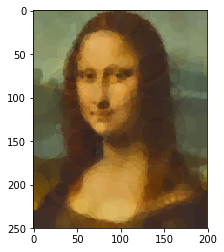

Shape count = 393, Iteration 62000, Time = 3250.3 sec. 
Best score = 3915.8, Mean score = 3916.3. Std = 0.20.


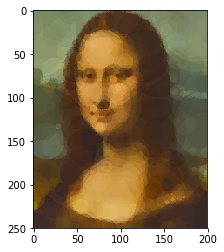

Shape count = 394, Iteration 62500, Time = 3276.5 sec. 
Best score = 3912.9, Mean score = 3912.9. Std = 0.00.


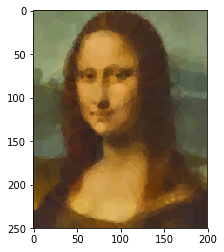

Shape count = 397, Iteration 63000, Time = 3303.0 sec. 
Best score = 3906.7, Mean score = 3907.1. Std = 0.14.


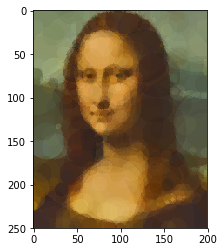

Shape count = 400, Iteration 63500, Time = 3329.3 sec. 
Best score = 3901.2, Mean score = 3901.7. Std = 0.15.


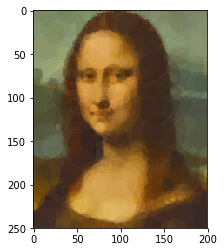

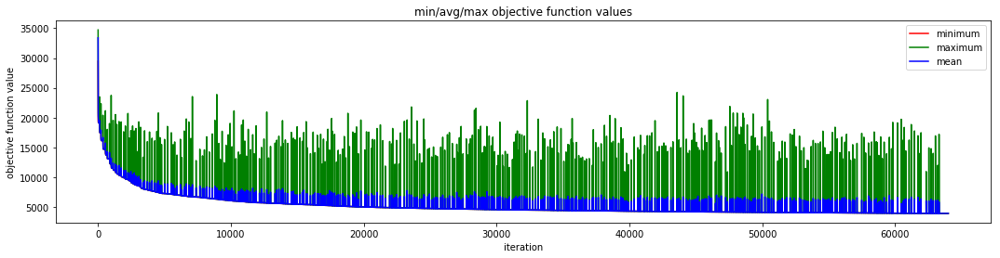

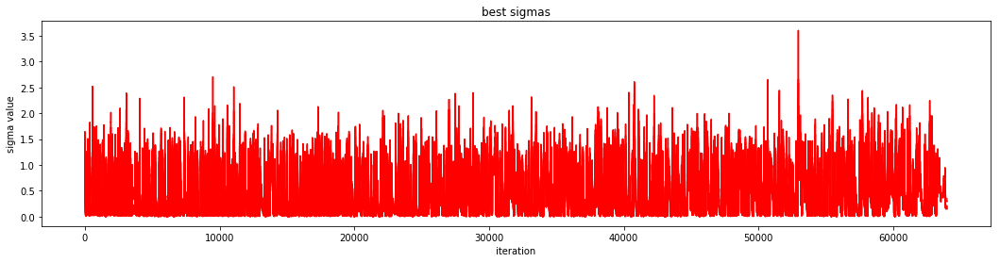

In [8]:
np.random.seed(16)

max_shapes = 400
N = 70
T = 64000

drawer = mona_utils.CircleDrawer(HEIGHT, WIDTH, SHAPE_LEN)
logger = mona_utils.BasicLogger(T, 500, SHAPE_LEN, drawer)

evolver = mona.MonaLisaES(target_img, drawer, shape_encoding_len=SHAPE_LEN,
                cuda=True, max_shapes=max_shapes, population=N, offspring=2*N, 
                parents=1, sigma=1.0, tau=0.3/np.sqrt(2*SHAPE_LEN), 
                tau_bias=0.3/np.sqrt(2*np.sqrt(SHAPE_LEN)),
                passive_iters_limit=50, starting_population=None, 
                custom_mutate_operator=None, log_objects=[logger])

logger.start_timer()
evolver.evolve(iters=T)

logger.save()
logger.show_results()

## Experiment 2

Experiment with high resolution image (400 px x 266 px).

In this experiment max number of shapes is set to 700. 
Population size is 70, child population size is 140.
New shape is added after 50 passive iterations.

Shape count = 1, Iteration 0000, Time = 0.2 sec. 
Best score = 30287.2, Mean score = 41117.9. Std = 2711.61.


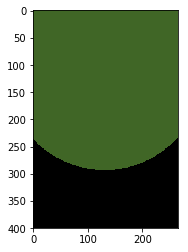

Shape count = 5, Iteration 0500, Time = 57.5 sec. 
Best score = 18951.6, Mean score = 19013.0. Std = 29.01.


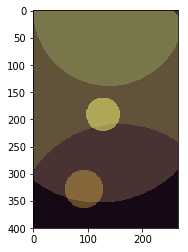

Shape count = 9, Iteration 1000, Time = 114.9 sec. 
Best score = 16590.1, Mean score = 16604.3. Std = 6.52.


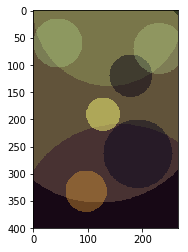

Shape count = 12, Iteration 1500, Time = 172.7 sec. 
Best score = 15349.5, Mean score = 15350.1. Std = 0.20.


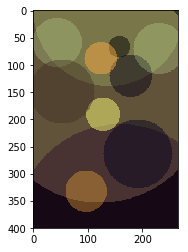

Shape count = 15, Iteration 2000, Time = 230.6 sec. 
Best score = 14985.8, Mean score = 14985.8. Std = 0.02.


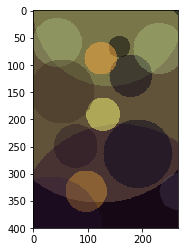

Shape count = 19, Iteration 2500, Time = 287.8 sec. 
Best score = 14580.0, Mean score = 14583.2. Std = 1.25.


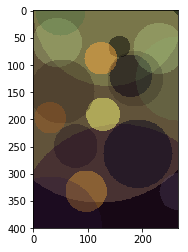

Shape count = 22, Iteration 3000, Time = 345.7 sec. 
Best score = 14400.1, Mean score = 14400.2. Std = 0.06.


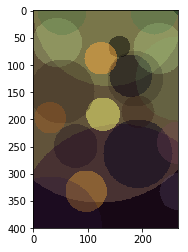

Shape count = 25, Iteration 3500, Time = 403.8 sec. 
Best score = 13910.5, Mean score = 13910.5. Std = 0.02.


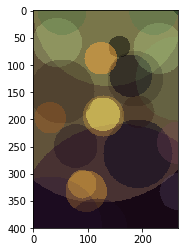

Shape count = 29, Iteration 4000, Time = 461.4 sec. 
Best score = 13552.9, Mean score = 13556.5. Std = 1.33.


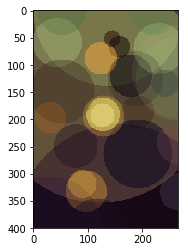

Shape count = 32, Iteration 4500, Time = 518.4 sec. 
Best score = 13249.0, Mean score = 13252.5. Std = 1.87.


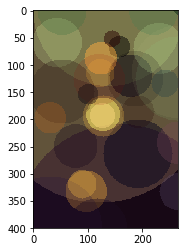

Shape count = 35, Iteration 5000, Time = 572.1 sec. 
Best score = 13033.8, Mean score = 13034.3. Std = 0.22.


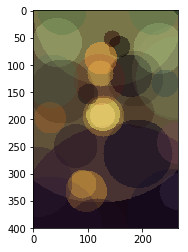

Shape count = 38, Iteration 5500, Time = 625.7 sec. 
Best score = 12809.9, Mean score = 12810.2. Std = 0.13.


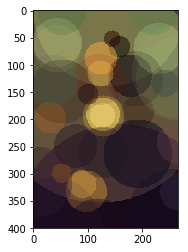

Shape count = 42, Iteration 6000, Time = 681.7 sec. 
Best score = 12556.0, Mean score = 12557.4. Std = 0.64.


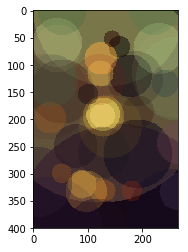

Shape count = 45, Iteration 6500, Time = 738.8 sec. 
Best score = 12371.3, Mean score = 12371.3. Std = 0.00.


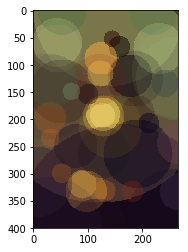

Shape count = 49, Iteration 7000, Time = 795.2 sec. 
Best score = 12133.2, Mean score = 12135.4. Std = 0.89.


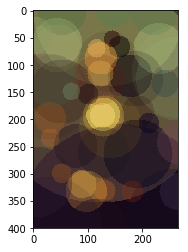

Shape count = 51, Iteration 7500, Time = 847.1 sec. 
Best score = 12020.2, Mean score = 12020.2. Std = 0.02.


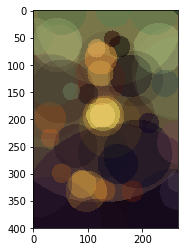

Shape count = 55, Iteration 8000, Time = 900.1 sec. 
Best score = 11842.4, Mean score = 11851.0. Std = 4.24.


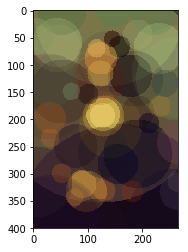

Shape count = 58, Iteration 8500, Time = 956.7 sec. 
Best score = 11749.0, Mean score = 11749.1. Std = 0.03.


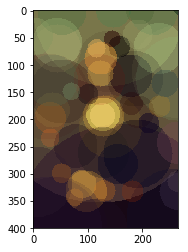

Shape count = 61, Iteration 9000, Time = 1014.8 sec. 
Best score = 11638.1, Mean score = 11652.1. Std = 3.54.


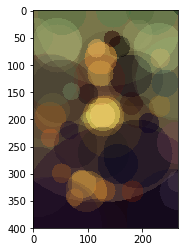

Shape count = 65, Iteration 9500, Time = 1072.5 sec. 
Best score = 11570.8, Mean score = 11572.2. Std = 0.55.


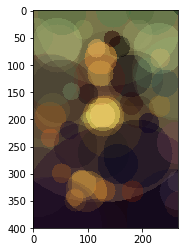

Shape count = 67, Iteration 10000, Time = 1129.8 sec. 
Best score = 11500.7, Mean score = 11505.0. Std = 1.46.


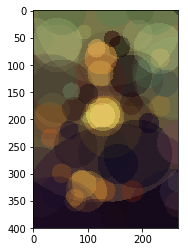

Shape count = 71, Iteration 10500, Time = 1186.8 sec. 
Best score = 11398.8, Mean score = 11399.1. Std = 0.09.


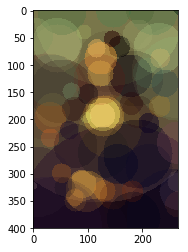

Shape count = 75, Iteration 11000, Time = 1244.2 sec. 
Best score = 11326.4, Mean score = 11326.6. Std = 0.09.


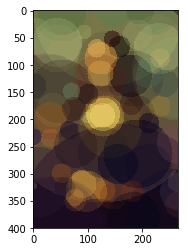

Shape count = 78, Iteration 11500, Time = 1301.5 sec. 
Best score = 11241.2, Mean score = 11241.2. Std = 0.00.


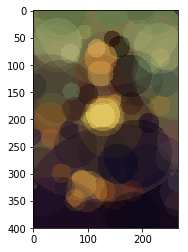

Shape count = 82, Iteration 12000, Time = 1358.3 sec. 
Best score = 11166.2, Mean score = 11166.6. Std = 0.14.


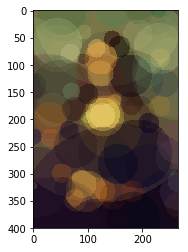

Shape count = 85, Iteration 12500, Time = 1413.5 sec. 
Best score = 11048.6, Mean score = 11048.6. Std = 0.00.


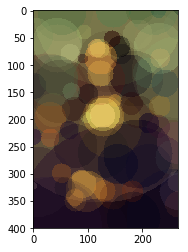

Shape count = 88, Iteration 13000, Time = 1470.6 sec. 
Best score = 10945.7, Mean score = 10946.3. Std = 0.21.


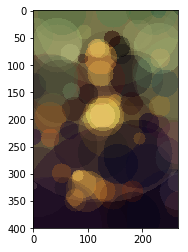

Shape count = 91, Iteration 13500, Time = 1528.0 sec. 
Best score = 10863.7, Mean score = 10870.1. Std = 1.33.


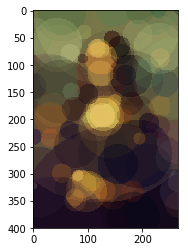

Shape count = 94, Iteration 14000, Time = 1581.6 sec. 
Best score = 10811.9, Mean score = 10812.3. Std = 0.17.


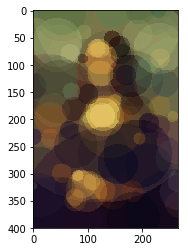

Shape count = 97, Iteration 14500, Time = 1638.6 sec. 
Best score = 10775.9, Mean score = 10775.9. Std = 0.00.


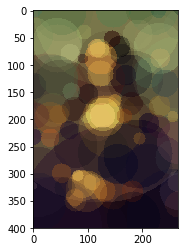

Shape count = 100, Iteration 15000, Time = 1695.7 sec. 
Best score = 10703.1, Mean score = 10703.3. Std = 0.08.


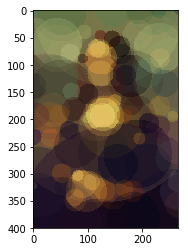

Shape count = 104, Iteration 15500, Time = 1753.5 sec. 
Best score = 10634.5, Mean score = 10635.0. Std = 0.18.


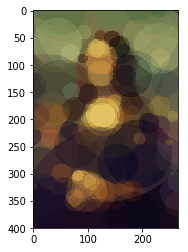

Shape count = 107, Iteration 16000, Time = 1810.3 sec. 
Best score = 10567.9, Mean score = 10571.9. Std = 1.36.


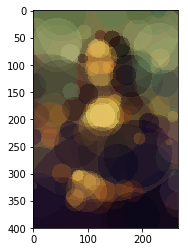

Shape count = 109, Iteration 16500, Time = 1867.6 sec. 
Best score = 10528.8, Mean score = 10529.0. Std = 0.06.


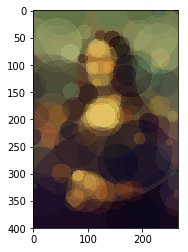

Shape count = 112, Iteration 17000, Time = 1924.7 sec. 
Best score = 10467.3, Mean score = 10467.7. Std = 0.11.


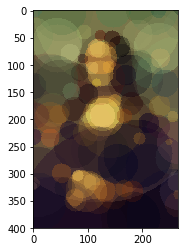

Shape count = 115, Iteration 17500, Time = 1981.4 sec. 
Best score = 10423.0, Mean score = 10426.7. Std = 0.72.


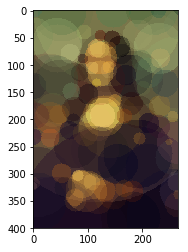

Shape count = 117, Iteration 18000, Time = 2038.2 sec. 
Best score = 10392.1, Mean score = 10393.7. Std = 0.67.


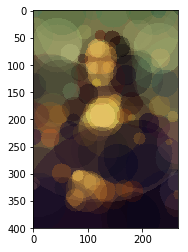

Shape count = 120, Iteration 18500, Time = 2095.2 sec. 
Best score = 10368.4, Mean score = 10368.4. Std = 0.00.


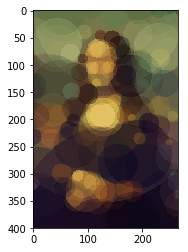

Shape count = 123, Iteration 19000, Time = 2152.3 sec. 
Best score = 10336.2, Mean score = 10336.2. Std = 0.00.


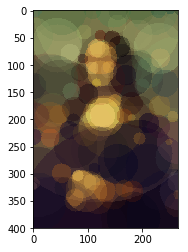

Shape count = 126, Iteration 19500, Time = 2209.8 sec. 
Best score = 10306.9, Mean score = 10307.1. Std = 0.08.


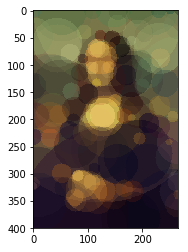

Shape count = 128, Iteration 20000, Time = 2266.8 sec. 
Best score = 10271.9, Mean score = 10272.0. Std = 0.01.


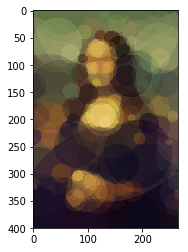

Shape count = 131, Iteration 20500, Time = 2324.2 sec. 
Best score = 10248.7, Mean score = 10251.3. Std = 0.85.


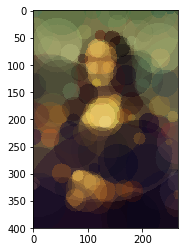

Shape count = 133, Iteration 21000, Time = 2380.8 sec. 
Best score = 10228.3, Mean score = 10228.3. Std = 0.00.


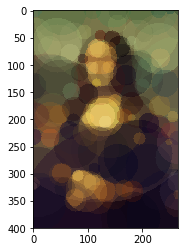

Shape count = 136, Iteration 21500, Time = 2437.9 sec. 
Best score = 10196.2, Mean score = 10202.0. Std = 1.99.


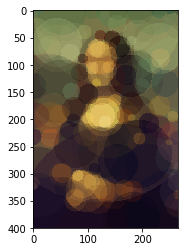

Shape count = 139, Iteration 22000, Time = 2494.4 sec. 
Best score = 10164.5, Mean score = 10164.8. Std = 0.07.


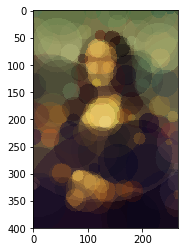

Shape count = 142, Iteration 22500, Time = 2550.9 sec. 
Best score = 10131.5, Mean score = 10131.7. Std = 0.08.


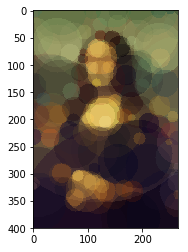

Shape count = 145, Iteration 23000, Time = 2607.5 sec. 
Best score = 10094.4, Mean score = 10094.5. Std = 0.06.


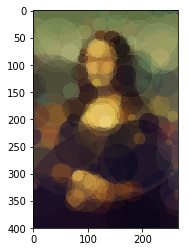

Shape count = 148, Iteration 23500, Time = 2662.8 sec. 
Best score = 10069.1, Mean score = 10069.1. Std = 0.00.


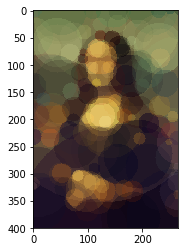

Shape count = 152, Iteration 24000, Time = 2720.1 sec. 
Best score = 10043.4, Mean score = 10046.2. Std = 0.69.


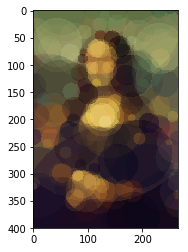

Shape count = 155, Iteration 24500, Time = 2777.3 sec. 
Best score = 10017.9, Mean score = 10020.2. Std = 0.72.


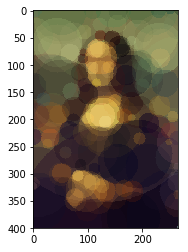

Shape count = 158, Iteration 25000, Time = 2834.6 sec. 
Best score = 9992.8, Mean score = 9998.9. Std = 6.59.


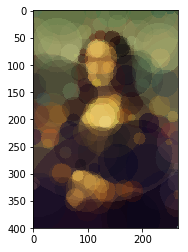

Shape count = 162, Iteration 25500, Time = 2892.0 sec. 
Best score = 9965.0, Mean score = 9965.6. Std = 0.22.


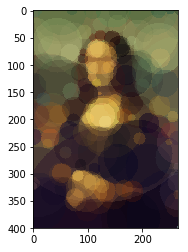

Shape count = 165, Iteration 26000, Time = 2949.0 sec. 
Best score = 9933.1, Mean score = 9934.6. Std = 0.22.


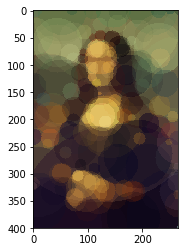

Shape count = 168, Iteration 26500, Time = 3005.5 sec. 
Best score = 9902.9, Mean score = 9903.1. Std = 0.10.


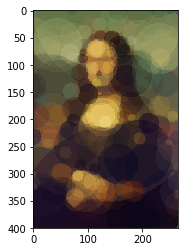

Shape count = 171, Iteration 27000, Time = 3062.5 sec. 
Best score = 9889.8, Mean score = 9893.1. Std = 0.49.


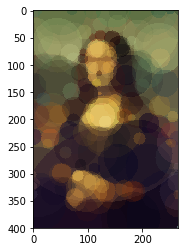

Shape count = 174, Iteration 27500, Time = 3119.4 sec. 
Best score = 9874.6, Mean score = 9874.9. Std = 0.10.


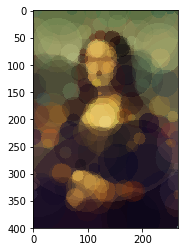

Shape count = 177, Iteration 28000, Time = 3176.4 sec. 
Best score = 9853.0, Mean score = 9853.0. Std = 0.00.


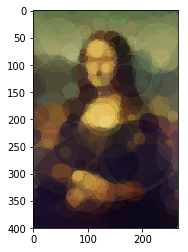

Shape count = 181, Iteration 28500, Time = 3232.5 sec. 
Best score = 9836.3, Mean score = 9839.4. Std = 0.83.


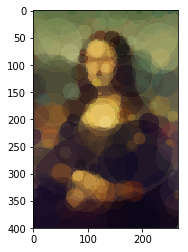

Shape count = 183, Iteration 29000, Time = 3285.6 sec. 
Best score = 9807.2, Mean score = 9807.6. Std = 0.13.


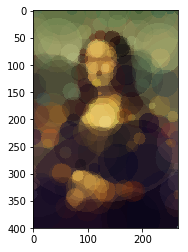

Shape count = 186, Iteration 29500, Time = 3341.0 sec. 
Best score = 9792.2, Mean score = 9792.2. Std = 0.02.


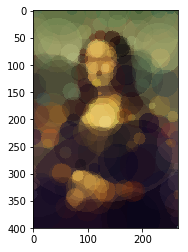

Shape count = 190, Iteration 30000, Time = 3397.8 sec. 
Best score = 9777.3, Mean score = 9777.8. Std = 0.20.


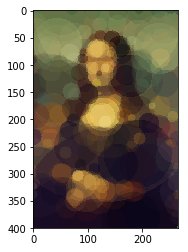

Shape count = 192, Iteration 30500, Time = 3454.8 sec. 
Best score = 9760.7, Mean score = 9760.9. Std = 0.09.


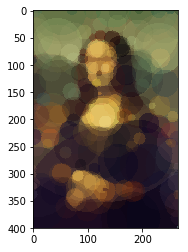

Shape count = 196, Iteration 31000, Time = 3512.1 sec. 
Best score = 9728.4, Mean score = 9728.6. Std = 0.04.


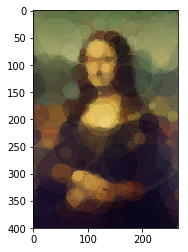

Shape count = 199, Iteration 31500, Time = 3568.2 sec. 
Best score = 9705.5, Mean score = 9705.9. Std = 0.16.


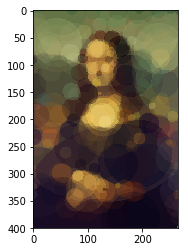

Shape count = 202, Iteration 32000, Time = 3625.5 sec. 
Best score = 9684.3, Mean score = 9686.1. Std = 0.46.


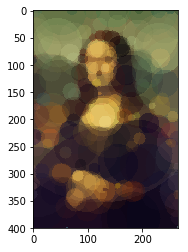

Shape count = 204, Iteration 32500, Time = 3682.8 sec. 
Best score = 9672.0, Mean score = 9672.0. Std = 0.01.


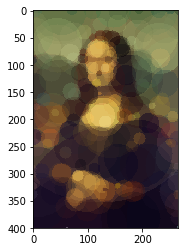

Shape count = 207, Iteration 33000, Time = 3740.2 sec. 
Best score = 9647.9, Mean score = 9650.0. Std = 0.82.


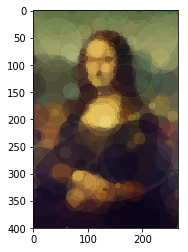

Shape count = 211, Iteration 33500, Time = 3797.3 sec. 
Best score = 9630.7, Mean score = 9630.8. Std = 0.00.


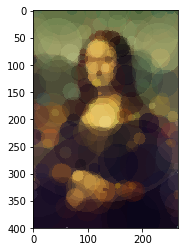

Shape count = 215, Iteration 34000, Time = 3854.1 sec. 
Best score = 9610.9, Mean score = 9613.4. Std = 0.77.


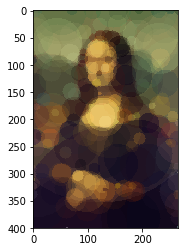

Shape count = 217, Iteration 34500, Time = 3911.3 sec. 
Best score = 9592.3, Mean score = 9592.3. Std = 0.00.


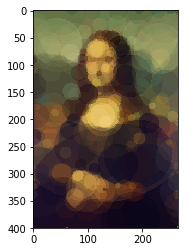

Shape count = 220, Iteration 35000, Time = 3968.5 sec. 
Best score = 9575.0, Mean score = 9575.0. Std = 0.00.


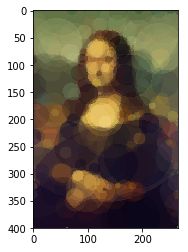

Shape count = 224, Iteration 35500, Time = 4025.8 sec. 
Best score = 9556.1, Mean score = 9558.0. Std = 0.28.


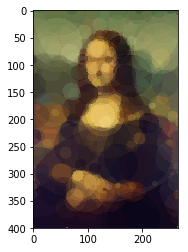

Shape count = 226, Iteration 36000, Time = 4082.9 sec. 
Best score = 9540.5, Mean score = 9541.0. Std = 0.21.


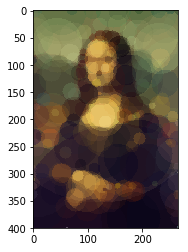

Shape count = 229, Iteration 36500, Time = 4138.1 sec. 
Best score = 9518.1, Mean score = 9518.4. Std = 0.13.


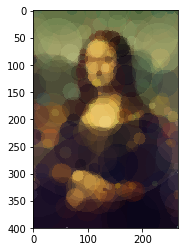

Shape count = 232, Iteration 37000, Time = 4193.6 sec. 
Best score = 9505.1, Mean score = 9505.2. Std = 0.03.


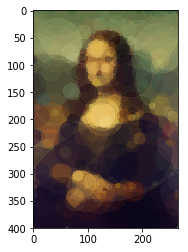

Shape count = 235, Iteration 37500, Time = 4251.1 sec. 
Best score = 9490.3, Mean score = 9491.4. Std = 0.48.


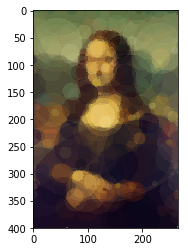

Shape count = 237, Iteration 38000, Time = 4308.2 sec. 
Best score = 9476.6, Mean score = 9477.2. Std = 0.21.


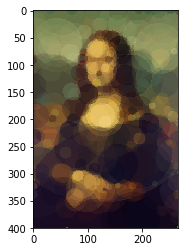

Shape count = 240, Iteration 38500, Time = 4365.7 sec. 
Best score = 9465.1, Mean score = 9465.6. Std = 0.12.


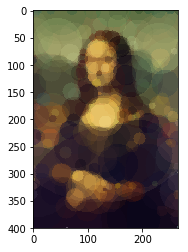

Shape count = 242, Iteration 39000, Time = 4423.4 sec. 
Best score = 9452.6, Mean score = 9452.7. Std = 0.10.


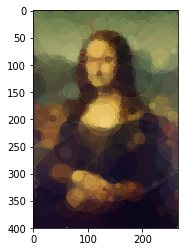

Shape count = 246, Iteration 39500, Time = 4480.3 sec. 
Best score = 9438.0, Mean score = 9439.2. Std = 0.43.


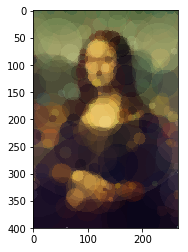

Shape count = 248, Iteration 40000, Time = 4537.5 sec. 
Best score = 9432.5, Mean score = 9432.9. Std = 0.15.


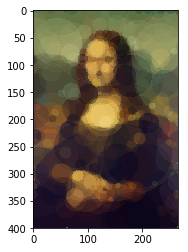

Shape count = 250, Iteration 40500, Time = 4594.0 sec. 
Best score = 9414.1, Mean score = 9416.6. Std = 0.91.


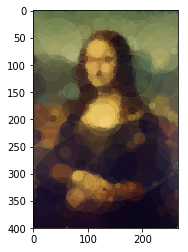

Shape count = 253, Iteration 41000, Time = 4651.4 sec. 
Best score = 9400.4, Mean score = 9400.6. Std = 0.09.


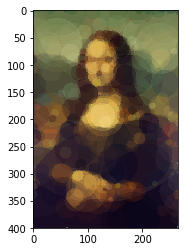

Shape count = 256, Iteration 41500, Time = 4709.4 sec. 
Best score = 9390.1, Mean score = 9390.8. Std = 0.22.


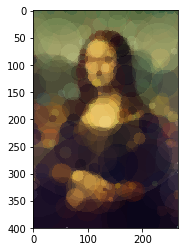

Shape count = 259, Iteration 42000, Time = 4766.9 sec. 
Best score = 9377.3, Mean score = 9379.0. Std = 0.40.


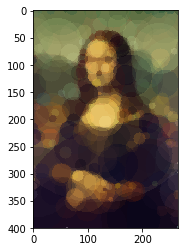

Shape count = 262, Iteration 42500, Time = 4824.1 sec. 
Best score = 9362.8, Mean score = 9363.0. Std = 0.12.


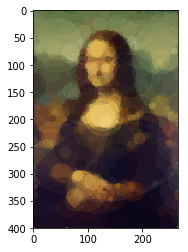

Shape count = 265, Iteration 43000, Time = 4881.4 sec. 
Best score = 9346.6, Mean score = 9347.5. Std = 0.29.


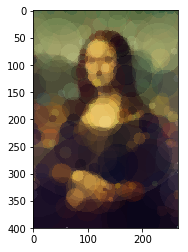

Shape count = 268, Iteration 43500, Time = 4938.4 sec. 
Best score = 9336.0, Mean score = 9336.3. Std = 0.13.


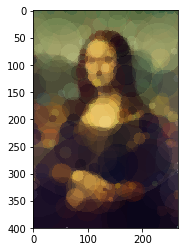

Shape count = 271, Iteration 44000, Time = 4993.4 sec. 
Best score = 9322.8, Mean score = 9323.3. Std = 0.16.


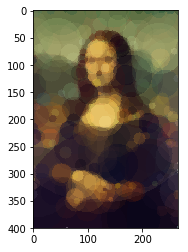

Shape count = 274, Iteration 44500, Time = 5050.9 sec. 
Best score = 9314.9, Mean score = 9316.5. Std = 0.49.


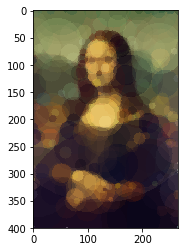

Shape count = 276, Iteration 45000, Time = 5107.9 sec. 
Best score = 9296.9, Mean score = 9297.8. Std = 0.37.


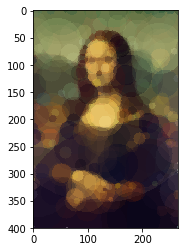

Shape count = 279, Iteration 45500, Time = 5165.3 sec. 
Best score = 9287.6, Mean score = 9287.7. Std = 0.03.


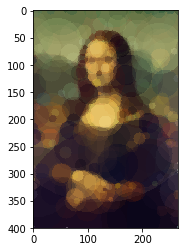

Shape count = 282, Iteration 46000, Time = 5222.3 sec. 
Best score = 9277.7, Mean score = 9278.1. Std = 0.17.


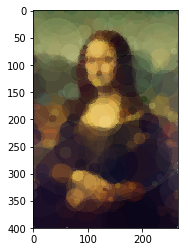

Shape count = 285, Iteration 46500, Time = 5279.2 sec. 
Best score = 9267.9, Mean score = 9269.5. Std = 0.32.


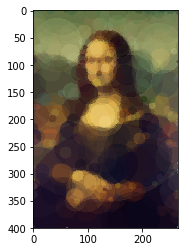

Shape count = 288, Iteration 47000, Time = 5336.6 sec. 
Best score = 9253.9, Mean score = 9253.9. Std = 0.00.


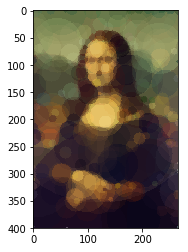

Shape count = 291, Iteration 47500, Time = 5393.9 sec. 
Best score = 9241.6, Mean score = 9241.6. Std = 0.00.


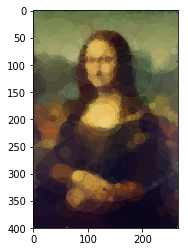

Shape count = 294, Iteration 48000, Time = 5451.3 sec. 
Best score = 9231.5, Mean score = 9231.5. Std = 0.00.


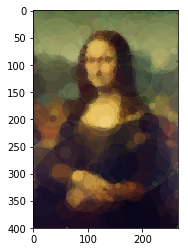

Shape count = 297, Iteration 48500, Time = 5508.0 sec. 
Best score = 9217.8, Mean score = 9217.8. Std = 0.00.


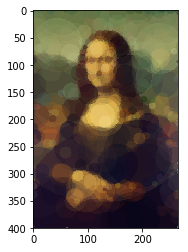

Shape count = 302, Iteration 49000, Time = 5566.4 sec. 
Best score = 9200.6, Mean score = 9204.2. Std = 0.71.


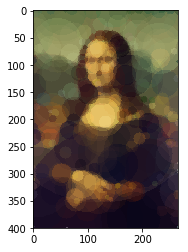

Shape count = 305, Iteration 49500, Time = 5623.3 sec. 
Best score = 9189.9, Mean score = 9190.4. Std = 0.20.


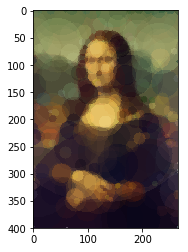

Shape count = 307, Iteration 50000, Time = 5680.3 sec. 
Best score = 9180.9, Mean score = 9180.9. Std = 0.00.


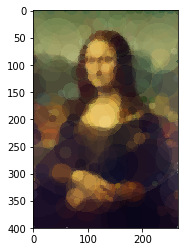

Shape count = 310, Iteration 50500, Time = 5737.4 sec. 
Best score = 9171.8, Mean score = 9171.8. Std = 0.02.


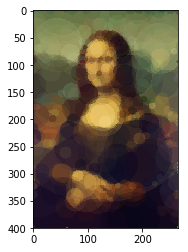

Shape count = 313, Iteration 51000, Time = 5795.0 sec. 
Best score = 9160.8, Mean score = 9162.2. Std = 0.40.


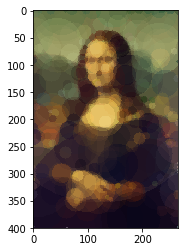

Shape count = 316, Iteration 51500, Time = 5852.5 sec. 
Best score = 9152.5, Mean score = 9152.5. Std = 0.00.


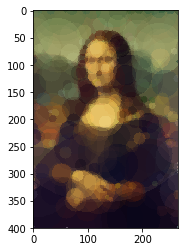

Shape count = 319, Iteration 52000, Time = 5910.0 sec. 
Best score = 9140.6, Mean score = 9140.6. Std = 0.00.


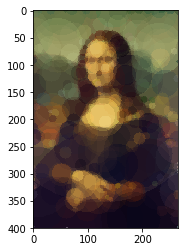

Shape count = 322, Iteration 52500, Time = 5967.7 sec. 
Best score = 9130.1, Mean score = 9130.7. Std = 0.26.


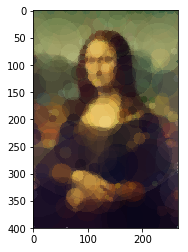

Shape count = 325, Iteration 53000, Time = 6025.6 sec. 
Best score = 9121.8, Mean score = 9123.0. Std = 0.30.


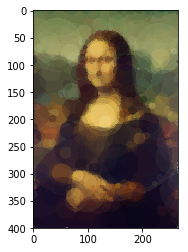

Shape count = 329, Iteration 53500, Time = 6083.4 sec. 
Best score = 9108.0, Mean score = 9108.1. Std = 0.07.


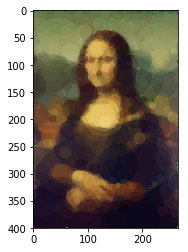

Shape count = 332, Iteration 54000, Time = 6141.6 sec. 
Best score = 9099.4, Mean score = 9099.4. Std = 0.00.


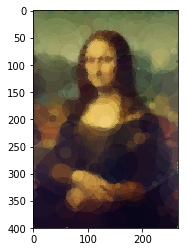

Shape count = 335, Iteration 54500, Time = 6199.6 sec. 
Best score = 9089.5, Mean score = 9089.5. Std = 0.00.


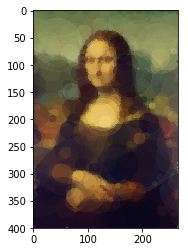

Shape count = 339, Iteration 55000, Time = 6254.3 sec. 
Best score = 9079.9, Mean score = 9080.8. Std = 0.21.


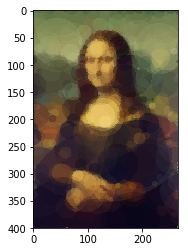

Shape count = 342, Iteration 55500, Time = 6309.0 sec. 
Best score = 9068.7, Mean score = 9069.9. Std = 0.38.


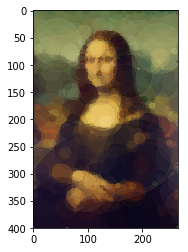

Shape count = 345, Iteration 56000, Time = 6366.8 sec. 
Best score = 9062.5, Mean score = 9063.5. Std = 0.29.


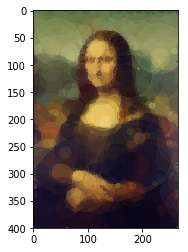

Shape count = 348, Iteration 56500, Time = 6424.6 sec. 
Best score = 9053.4, Mean score = 9054.6. Std = 0.34.


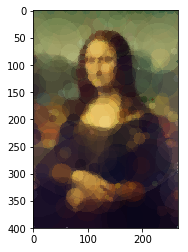

Shape count = 351, Iteration 57000, Time = 6482.6 sec. 
Best score = 9045.6, Mean score = 9046.2. Std = 0.18.


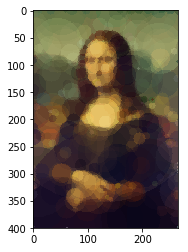

Shape count = 355, Iteration 57500, Time = 6540.5 sec. 
Best score = 9035.3, Mean score = 9036.1. Std = 0.31.


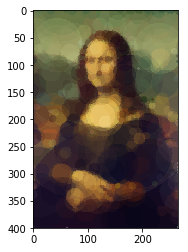

Shape count = 358, Iteration 58000, Time = 6598.5 sec. 
Best score = 9025.7, Mean score = 9026.4. Std = 0.25.


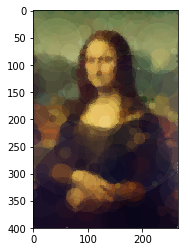

Shape count = 360, Iteration 58500, Time = 6656.9 sec. 
Best score = 9015.1, Mean score = 9015.1. Std = 0.01.


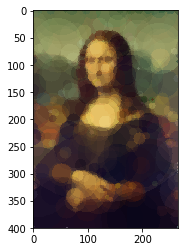

Shape count = 364, Iteration 59000, Time = 6714.6 sec. 
Best score = 9007.3, Mean score = 9008.3. Std = 0.20.


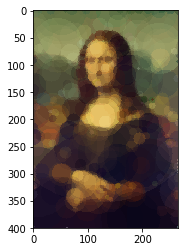

Shape count = 367, Iteration 59500, Time = 6772.8 sec. 
Best score = 8998.9, Mean score = 8999.8. Std = 0.16.


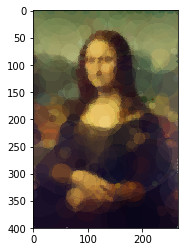

Shape count = 370, Iteration 60000, Time = 6829.7 sec. 
Best score = 8990.9, Mean score = 8992.0. Std = 0.42.


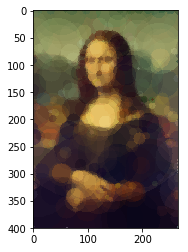

Shape count = 374, Iteration 60500, Time = 6887.3 sec. 
Best score = 8980.9, Mean score = 8981.4. Std = 0.13.


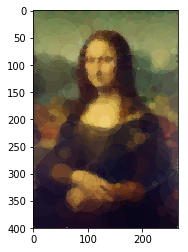

Shape count = 377, Iteration 61000, Time = 6944.7 sec. 
Best score = 8968.5, Mean score = 8969.1. Std = 0.23.


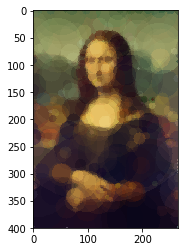

Shape count = 380, Iteration 61500, Time = 7002.2 sec. 
Best score = 8963.2, Mean score = 8963.5. Std = 0.12.


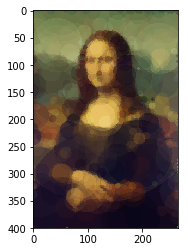

Shape count = 384, Iteration 62000, Time = 7059.6 sec. 
Best score = 8952.4, Mean score = 8953.9. Std = 0.36.


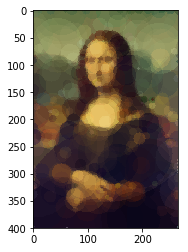

Shape count = 387, Iteration 62500, Time = 7116.9 sec. 
Best score = 8944.5, Mean score = 8944.8. Std = 0.12.


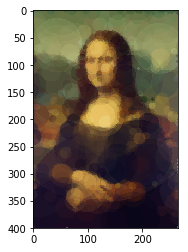

Shape count = 390, Iteration 63000, Time = 7173.9 sec. 
Best score = 8936.5, Mean score = 8937.4. Std = 0.17.


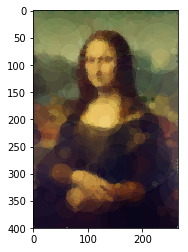

Shape count = 394, Iteration 63500, Time = 7232.0 sec. 
Best score = 8932.3, Mean score = 8933.0. Std = 0.24.


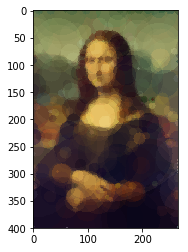

Shape count = 397, Iteration 64000, Time = 7289.5 sec. 
Best score = 8926.4, Mean score = 8926.9. Std = 0.15.


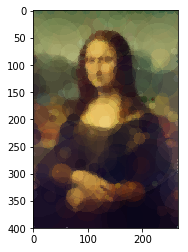

Shape count = 399, Iteration 64500, Time = 7346.5 sec. 
Best score = 8919.7, Mean score = 8920.1. Std = 0.15.


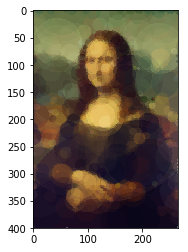

Shape count = 401, Iteration 65000, Time = 7403.2 sec. 
Best score = 8913.9, Mean score = 8913.9. Std = 0.02.


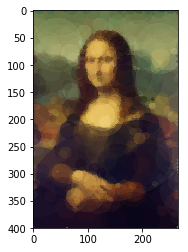

Shape count = 404, Iteration 65500, Time = 7459.2 sec. 
Best score = 8906.9, Mean score = 8907.7. Std = 0.22.


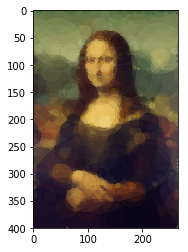

Shape count = 406, Iteration 66000, Time = 7515.9 sec. 
Best score = 8900.9, Mean score = 8901.0. Std = 0.03.


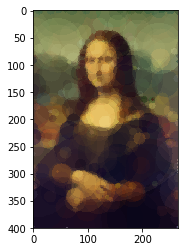

Shape count = 410, Iteration 66500, Time = 7571.0 sec. 
Best score = 8894.2, Mean score = 8894.4. Std = 0.06.


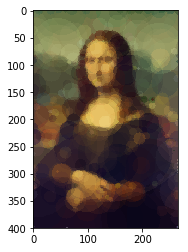

Shape count = 413, Iteration 67000, Time = 7628.0 sec. 
Best score = 8887.8, Mean score = 8888.3. Std = 0.13.


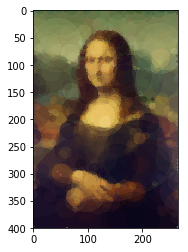

Shape count = 416, Iteration 67500, Time = 7686.2 sec. 
Best score = 8878.5, Mean score = 8880.7. Std = 0.46.


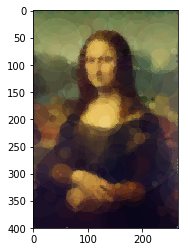

Shape count = 419, Iteration 68000, Time = 7744.2 sec. 
Best score = 8874.5, Mean score = 8875.1. Std = 0.13.


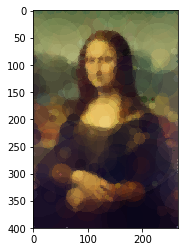

Shape count = 422, Iteration 68500, Time = 7799.1 sec. 
Best score = 8866.2, Mean score = 8866.6. Std = 0.19.


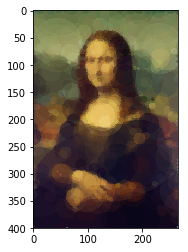

Shape count = 427, Iteration 69000, Time = 7854.9 sec. 
Best score = 8857.9, Mean score = 8858.5. Std = 0.17.


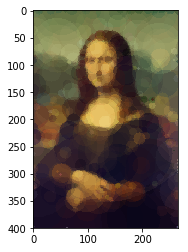

Shape count = 430, Iteration 69500, Time = 7912.7 sec. 
Best score = 8852.1, Mean score = 8852.4. Std = 0.08.


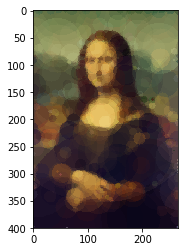

Shape count = 433, Iteration 70000, Time = 7970.4 sec. 
Best score = 8846.4, Mean score = 8847.6. Std = 0.27.


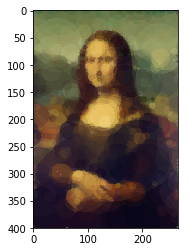

Shape count = 437, Iteration 70500, Time = 8027.3 sec. 
Best score = 8840.1, Mean score = 8840.7. Std = 0.18.


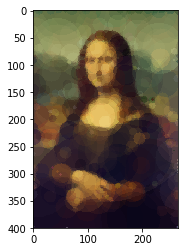

Shape count = 441, Iteration 71000, Time = 8084.8 sec. 
Best score = 8834.4, Mean score = 8834.4. Std = 0.01.


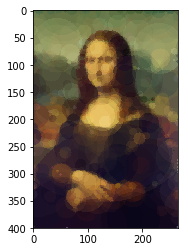

Shape count = 447, Iteration 71500, Time = 8142.3 sec. 
Best score = 8827.6, Mean score = 8828.2. Std = 0.13.


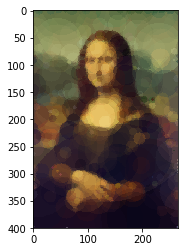

Shape count = 449, Iteration 72000, Time = 8200.7 sec. 
Best score = 8823.9, Mean score = 8824.5. Std = 0.28.


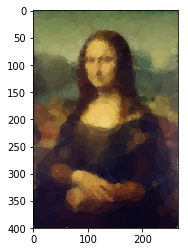

Shape count = 453, Iteration 72500, Time = 8259.2 sec. 
Best score = 8816.0, Mean score = 8816.0. Std = 0.00.


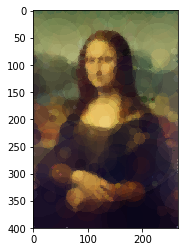

Shape count = 459, Iteration 73000, Time = 8317.4 sec. 
Best score = 8809.0, Mean score = 8809.6. Std = 0.11.


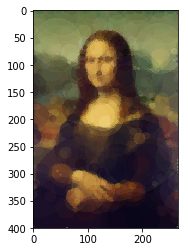

Shape count = 463, Iteration 73500, Time = 8374.7 sec. 
Best score = 8804.2, Mean score = 8804.9. Std = 0.19.


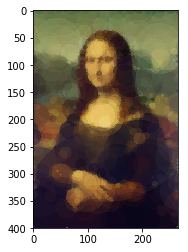

Shape count = 467, Iteration 74000, Time = 8432.3 sec. 
Best score = 8796.4, Mean score = 8797.6. Std = 0.36.


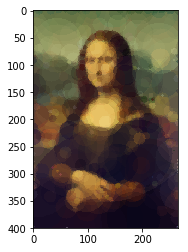

Shape count = 470, Iteration 74500, Time = 8489.5 sec. 
Best score = 8791.9, Mean score = 8792.0. Std = 0.05.


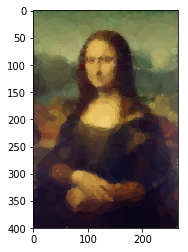

Shape count = 474, Iteration 75000, Time = 8547.0 sec. 
Best score = 8785.1, Mean score = 8785.3. Std = 0.07.


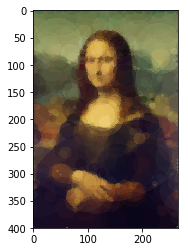

Shape count = 476, Iteration 75500, Time = 8604.4 sec. 
Best score = 8778.9, Mean score = 8779.3. Std = 0.13.


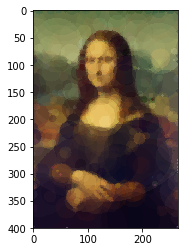

Shape count = 479, Iteration 76000, Time = 8661.5 sec. 
Best score = 8772.3, Mean score = 8773.7. Std = 0.41.


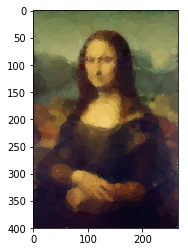

Shape count = 483, Iteration 76500, Time = 8719.1 sec. 
Best score = 8766.6, Mean score = 8781.7. Std = 15.88.


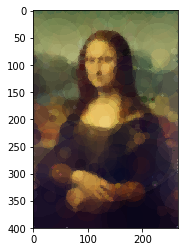

Shape count = 487, Iteration 77000, Time = 8775.6 sec. 
Best score = 8758.6, Mean score = 8758.9. Std = 0.11.


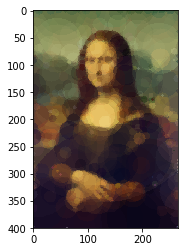

Shape count = 491, Iteration 77500, Time = 8834.0 sec. 
Best score = 8752.7, Mean score = 8753.2. Std = 0.10.


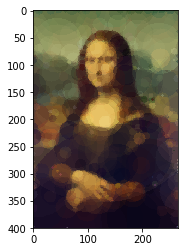

Shape count = 493, Iteration 78000, Time = 8891.8 sec. 
Best score = 8748.7, Mean score = 8749.1. Std = 0.15.


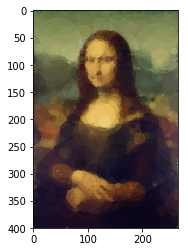

Shape count = 495, Iteration 78500, Time = 8949.3 sec. 
Best score = 8742.5, Mean score = 8743.1. Std = 0.18.


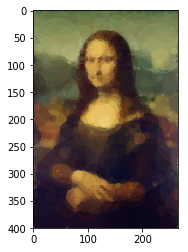

Shape count = 498, Iteration 79000, Time = 9007.5 sec. 
Best score = 8737.0, Mean score = 8737.0. Std = 0.01.


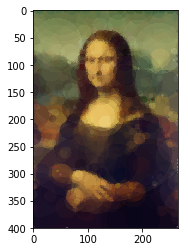

Shape count = 502, Iteration 79500, Time = 9065.8 sec. 
Best score = 8731.4, Mean score = 8732.1. Std = 0.22.


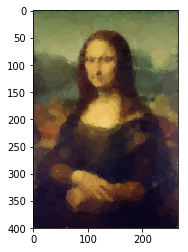

Shape count = 504, Iteration 80000, Time = 9123.6 sec. 
Best score = 8727.8, Mean score = 8727.8. Std = 0.00.


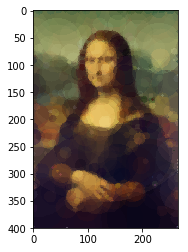

Shape count = 506, Iteration 80500, Time = 9181.7 sec. 
Best score = 8725.2, Mean score = 8725.6. Std = 0.14.


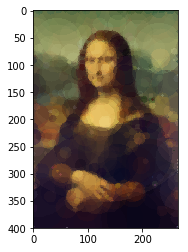

Shape count = 509, Iteration 81000, Time = 9239.0 sec. 
Best score = 8720.9, Mean score = 8721.4. Std = 0.13.


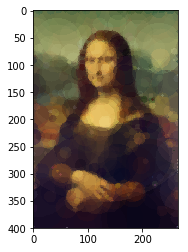

Shape count = 512, Iteration 81500, Time = 9295.9 sec. 
Best score = 8716.3, Mean score = 8716.3. Std = 0.00.


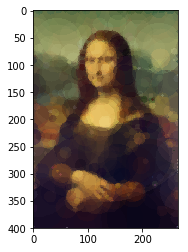

Shape count = 517, Iteration 82000, Time = 9353.1 sec. 
Best score = 8710.4, Mean score = 8710.7. Std = 0.09.


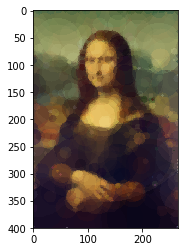

Shape count = 520, Iteration 82500, Time = 9410.6 sec. 
Best score = 8706.0, Mean score = 8706.4. Std = 0.10.


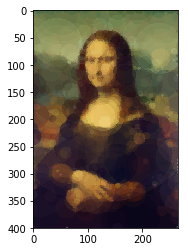

Shape count = 524, Iteration 83000, Time = 9468.3 sec. 
Best score = 8700.6, Mean score = 8701.1. Std = 0.09.


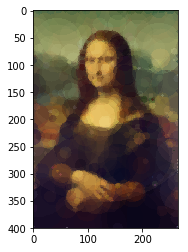

Shape count = 527, Iteration 83500, Time = 9526.1 sec. 
Best score = 8694.9, Mean score = 8695.5. Std = 0.16.


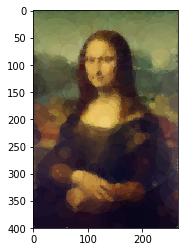

Shape count = 530, Iteration 84000, Time = 9583.8 sec. 
Best score = 8691.7, Mean score = 8691.7. Std = 0.00.


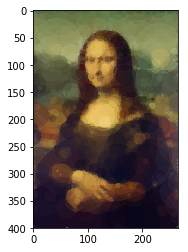

Shape count = 534, Iteration 84500, Time = 9642.3 sec. 
Best score = 8686.6, Mean score = 8687.2. Std = 0.15.


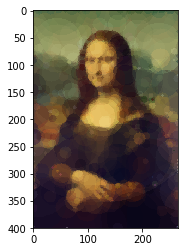

Shape count = 537, Iteration 85000, Time = 9700.9 sec. 
Best score = 8682.4, Mean score = 8682.7. Std = 0.09.


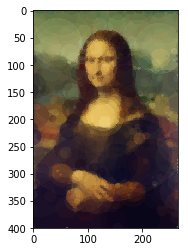

Shape count = 540, Iteration 85500, Time = 9758.9 sec. 
Best score = 8677.7, Mean score = 8677.7. Std = 0.00.


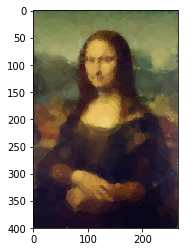

Shape count = 544, Iteration 86000, Time = 9817.5 sec. 
Best score = 8672.2, Mean score = 8672.5. Std = 0.06.


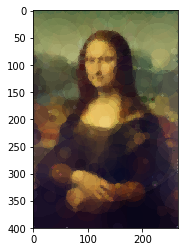

Shape count = 547, Iteration 86500, Time = 9875.1 sec. 
Best score = 8668.6, Mean score = 8668.7. Std = 0.07.


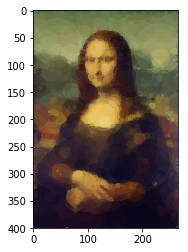

Shape count = 552, Iteration 87000, Time = 9932.5 sec. 
Best score = 8663.3, Mean score = 8664.0. Std = 0.11.


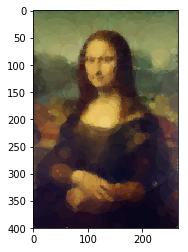

Shape count = 555, Iteration 87500, Time = 9989.8 sec. 
Best score = 8658.4, Mean score = 8658.5. Std = 0.06.


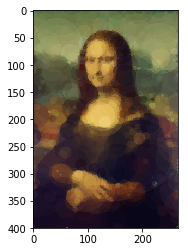

Shape count = 558, Iteration 88000, Time = 10046.9 sec. 
Best score = 8658.7, Mean score = 10486.2. Std = 2224.20.


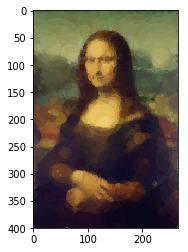

Shape count = 561, Iteration 88500, Time = 10103.0 sec. 
Best score = 8651.4, Mean score = 8652.2. Std = 0.17.


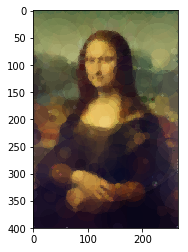

Shape count = 565, Iteration 89000, Time = 10159.9 sec. 
Best score = 8647.0, Mean score = 8647.8. Std = 0.19.


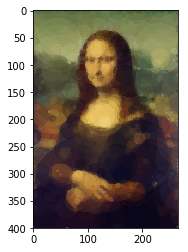

Shape count = 568, Iteration 89500, Time = 10216.1 sec. 
Best score = 8642.4, Mean score = 8643.0. Std = 0.18.


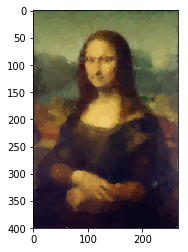

Shape count = 571, Iteration 90000, Time = 10273.4 sec. 
Best score = 8637.3, Mean score = 8637.9. Std = 0.20.


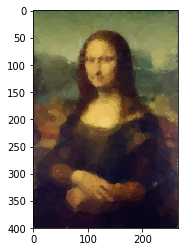

Shape count = 574, Iteration 90500, Time = 10330.5 sec. 
Best score = 8632.6, Mean score = 8632.6. Std = 0.03.


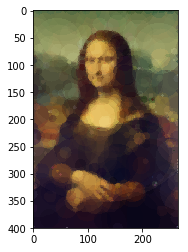

Shape count = 579, Iteration 91000, Time = 10388.4 sec. 
Best score = 8626.4, Mean score = 8627.3. Std = 0.22.


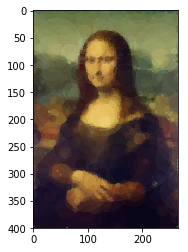

Shape count = 582, Iteration 91500, Time = 10446.1 sec. 
Best score = 8622.6, Mean score = 8623.1. Std = 0.15.


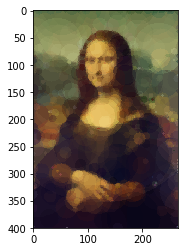

Shape count = 585, Iteration 92000, Time = 10503.8 sec. 
Best score = 8618.6, Mean score = 8619.7. Std = 0.19.


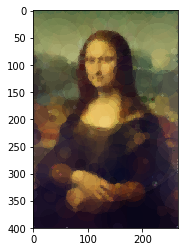

Shape count = 588, Iteration 92500, Time = 10560.9 sec. 
Best score = 8613.7, Mean score = 8614.1. Std = 0.11.


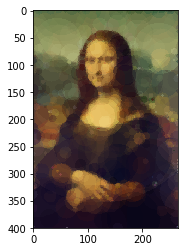

Shape count = 591, Iteration 93000, Time = 10617.6 sec. 
Best score = 8611.3, Mean score = 8613.9. Std = 1.90.


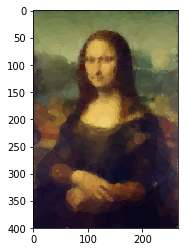

Shape count = 594, Iteration 93500, Time = 10676.0 sec. 
Best score = 8607.0, Mean score = 8607.3. Std = 0.11.


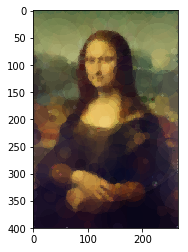

Shape count = 598, Iteration 94000, Time = 10734.8 sec. 
Best score = 8602.3, Mean score = 8603.0. Std = 0.19.


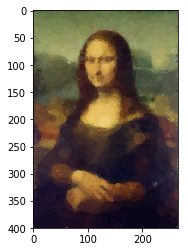

Shape count = 601, Iteration 94500, Time = 10791.8 sec. 
Best score = 8597.4, Mean score = 8597.5. Std = 0.01.


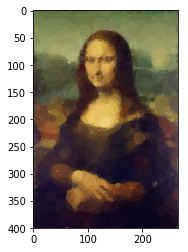

Shape count = 604, Iteration 95000, Time = 10848.6 sec. 
Best score = 8593.1, Mean score = 8593.2. Std = 0.05.


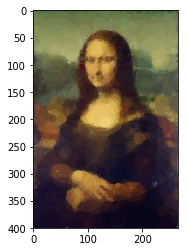

Shape count = 607, Iteration 95500, Time = 10906.3 sec. 
Best score = 8589.4, Mean score = 8589.4. Std = 0.00.


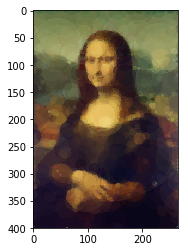

Shape count = 611, Iteration 96000, Time = 10964.1 sec. 
Best score = 8584.9, Mean score = 8585.4. Std = 0.15.


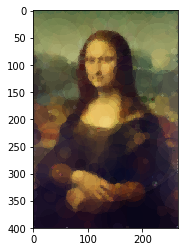

Shape count = 615, Iteration 96500, Time = 11021.6 sec. 
Best score = 8580.1, Mean score = 8580.1. Std = 0.00.


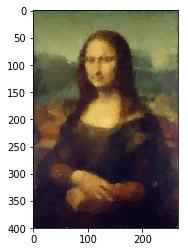

Shape count = 620, Iteration 97000, Time = 11079.3 sec. 
Best score = 8574.9, Mean score = 8575.4. Std = 0.14.


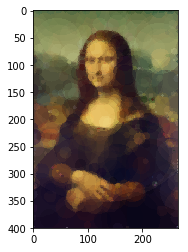

Shape count = 624, Iteration 97500, Time = 11137.4 sec. 
Best score = 8570.6, Mean score = 8570.9. Std = 0.11.


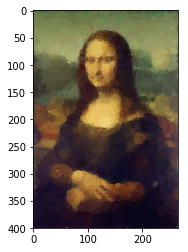

Shape count = 628, Iteration 98000, Time = 11195.5 sec. 
Best score = 8566.5, Mean score = 8567.2. Std = 0.12.


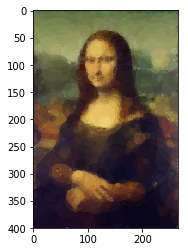

Shape count = 632, Iteration 98500, Time = 11253.5 sec. 
Best score = 8563.3, Mean score = 8563.7. Std = 0.12.


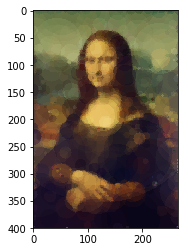

Shape count = 635, Iteration 99000, Time = 11311.1 sec. 
Best score = 8560.2, Mean score = 8560.4. Std = 0.05.


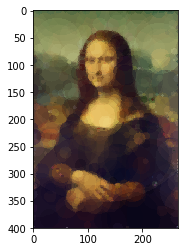

Shape count = 639, Iteration 99500, Time = 11369.1 sec. 
Best score = 8556.5, Mean score = 8556.9. Std = 0.12.


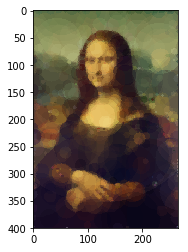

Shape count = 643, Iteration 100000, Time = 11426.9 sec. 
Best score = 8552.8, Mean score = 8553.0. Std = 0.05.


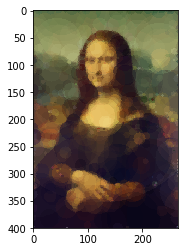

Shape count = 647, Iteration 100500, Time = 11484.5 sec. 
Best score = 8547.9, Mean score = 8548.3. Std = 0.10.


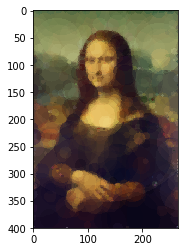

Shape count = 651, Iteration 101000, Time = 11542.2 sec. 
Best score = 8544.2, Mean score = 8544.9. Std = 0.14.


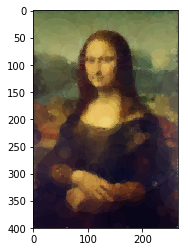

Shape count = 654, Iteration 101500, Time = 11599.9 sec. 
Best score = 8540.6, Mean score = 8541.1. Std = 0.14.


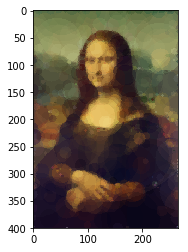

Shape count = 658, Iteration 102000, Time = 11657.7 sec. 
Best score = 8536.4, Mean score = 8537.0. Std = 0.11.


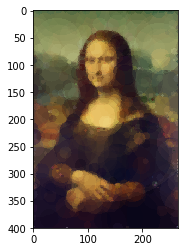

Shape count = 661, Iteration 102500, Time = 11715.0 sec. 
Best score = 8531.8, Mean score = 8531.8. Std = 0.01.


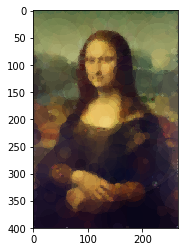

Shape count = 665, Iteration 103000, Time = 11773.0 sec. 
Best score = 8527.2, Mean score = 8527.3. Std = 0.02.


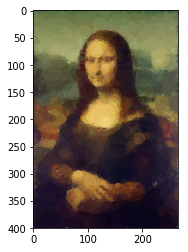

Shape count = 668, Iteration 103500, Time = 11830.3 sec. 
Best score = 8523.0, Mean score = 8523.0. Std = 0.01.


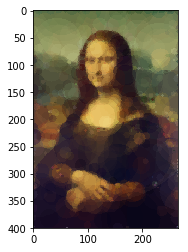

Shape count = 671, Iteration 104000, Time = 11887.6 sec. 
Best score = 8519.3, Mean score = 8519.8. Std = 0.14.


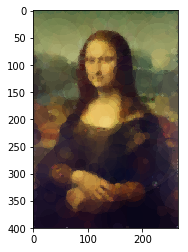

Shape count = 673, Iteration 104500, Time = 11944.6 sec. 
Best score = 8515.9, Mean score = 8516.6. Std = 0.15.


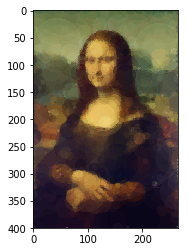

Shape count = 676, Iteration 105000, Time = 12001.7 sec. 
Best score = 8512.3, Mean score = 8512.5. Std = 0.12.


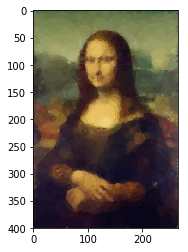

Shape count = 679, Iteration 105500, Time = 12059.0 sec. 
Best score = 8508.6, Mean score = 8508.9. Std = 0.10.


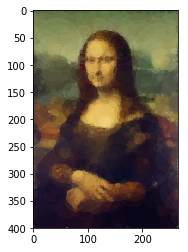

Shape count = 682, Iteration 106000, Time = 12116.0 sec. 
Best score = 8505.1, Mean score = 8505.1. Std = 0.00.


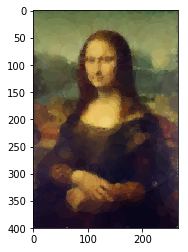

Shape count = 686, Iteration 106500, Time = 12173.0 sec. 
Best score = 8501.7, Mean score = 8502.0. Std = 0.10.


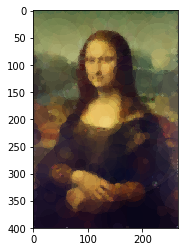

Shape count = 689, Iteration 107000, Time = 12229.3 sec. 
Best score = 8498.8, Mean score = 8499.1. Std = 0.06.


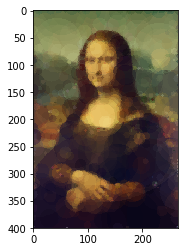

Shape count = 692, Iteration 107500, Time = 12287.1 sec. 
Best score = 8495.2, Mean score = 8495.5. Std = 0.09.


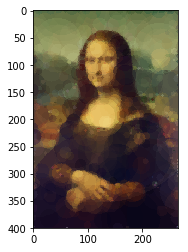

Shape count = 696, Iteration 108000, Time = 12344.8 sec. 
Best score = 8492.0, Mean score = 8492.0. Std = 0.00.


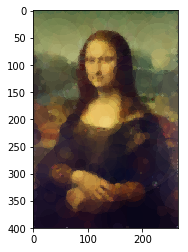

Shape count = 700, Iteration 108500, Time = 12398.9 sec. 
Best score = 8488.1, Mean score = 8488.6. Std = 0.15.


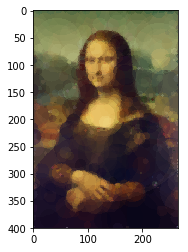

Shape count = 700, Iteration 109000, Time = 12456.5 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


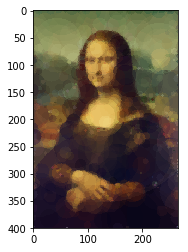

Shape count = 700, Iteration 109500, Time = 12514.6 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


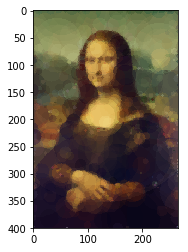

Shape count = 700, Iteration 110000, Time = 12572.0 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


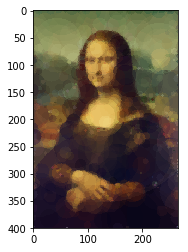

Shape count = 700, Iteration 110500, Time = 12629.2 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


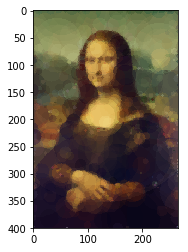

Shape count = 700, Iteration 111000, Time = 12686.5 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


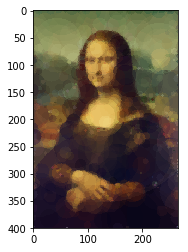

Shape count = 700, Iteration 111500, Time = 12743.6 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


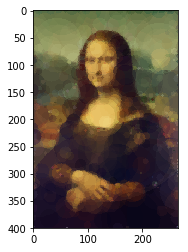

Shape count = 700, Iteration 112000, Time = 12800.2 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


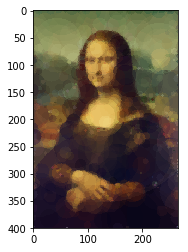

Shape count = 700, Iteration 112500, Time = 12856.7 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


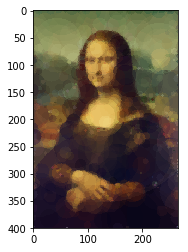

Shape count = 700, Iteration 113000, Time = 12912.2 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


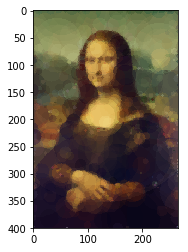

Shape count = 700, Iteration 113500, Time = 12968.2 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


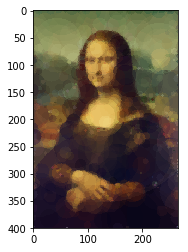

Shape count = 700, Iteration 114000, Time = 13025.0 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


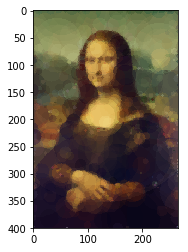

Shape count = 700, Iteration 114500, Time = 13081.9 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


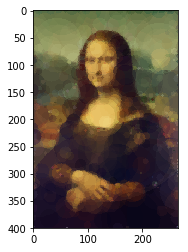

Shape count = 700, Iteration 115000, Time = 13138.4 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


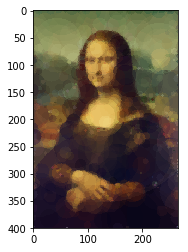

Shape count = 700, Iteration 115500, Time = 13196.5 sec. 
Best score = 8487.9, Mean score = 8487.9. Std = 0.00.


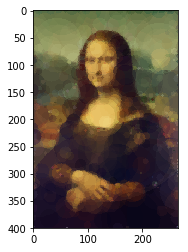

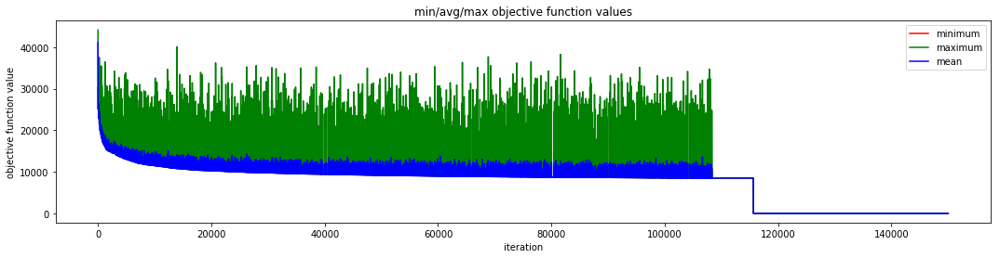

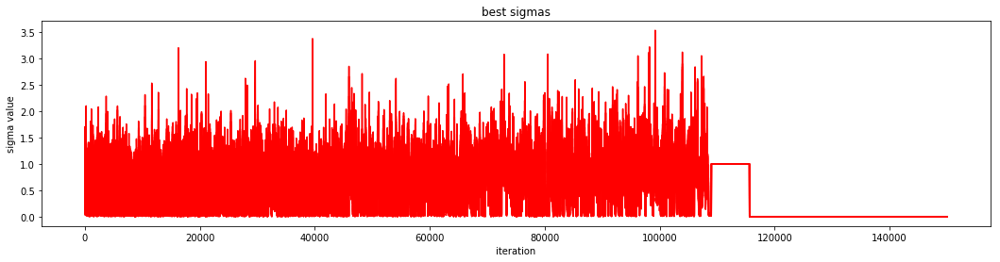

In [11]:
np.random.seed(16)

max_shapes = 700
N = 70
T = 150000

drawer = mona_utils.CircleDrawer(HEIGHT, WIDTH, SHAPE_LEN)
logger = mona_utils.BasicLogger(T, 500, SHAPE_LEN, drawer)

evolver = mona.MonaLisaES(target_img, drawer, shape_encoding_len=SHAPE_LEN,
                cuda=True, max_shapes=max_shapes, population=N, offspring=2*N, 
                parents=1, sigma=1.0, tau=0.3/np.sqrt(2*SHAPE_LEN), 
                tau_bias=0.3/np.sqrt(2*np.sqrt(SHAPE_LEN)),
                passive_iters_limit=50, starting_population=None, 
                custom_mutate_operator=None, log_objects=[logger])

logger.start_timer()
evolver.evolve(iters=T)

logger.save()
logger.show_results()

## Results

### Experiment 1 result

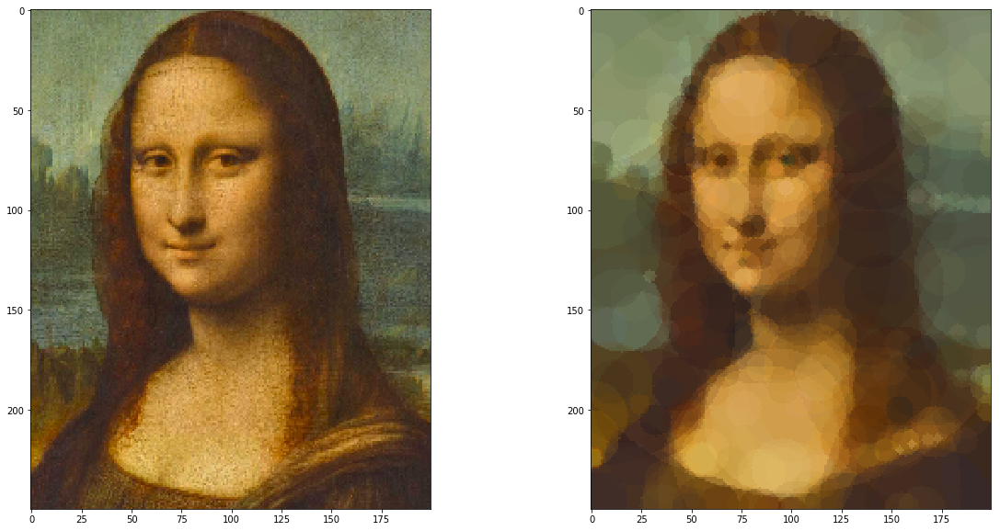

In [9]:
im = drawer.draw(evolver.current_population.best())
im = np.asarray(im)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(target_img)
plt.subplot(122)
plt.imshow(im)
plt.show()

### Experiment 2 result

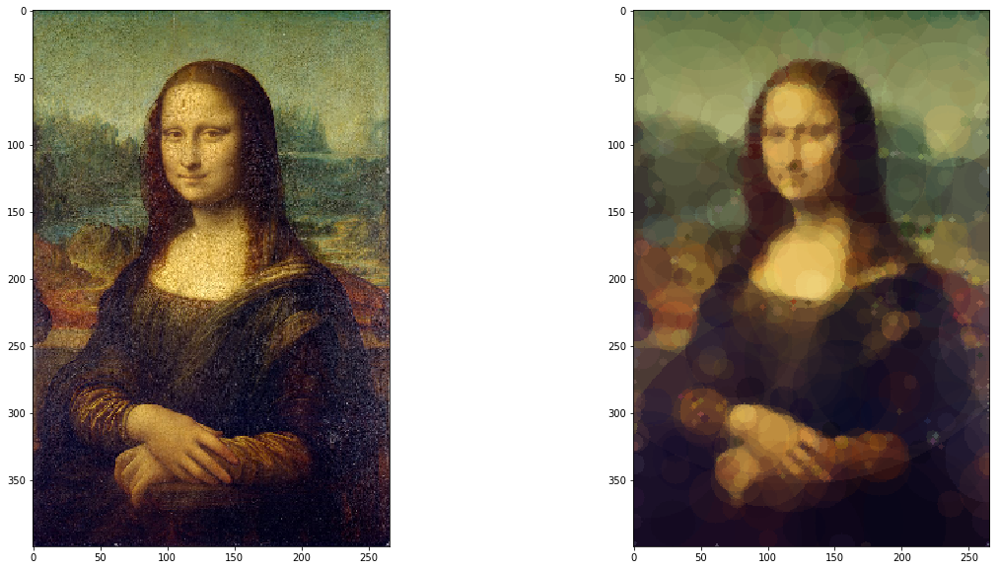

In [24]:
im = drawer.draw(evolver.current_population.best())
im = np.asarray(im)

plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(target_img)
plt.subplot(122)
plt.imshow(im)
plt.show()

## Possible extensions

Currently, the algorithm isn't altering order of shapes. New shapes are always drawn on top of older shapes. Also, after a shape is added to the fixed image, it can't be mutated anymore. Algorithms which can mutate all of the shapes in each iteration will probably do better results with the same number of shapes used to reproduce image. However their computing time is much worse. 

A possible way, to improve the result of the algorithm presented in this project is to start another algorithm on image produced by the original algorithm. This new algorithm would mutate all of the shapes in the image. It could also swap some shapes in chromosome to change their order. This algorithm could improve final result with no new shapes added.


## Conclusions

I think approach presented in this project gives quite good results. Serial evolving shapes makes the process much faster and quality loss is not that bad.